Environment: `velocity`

In [1]:
import scanpy
import anndata
import matplotlib
from matplotlib import pyplot
import hdf5plugin
import numpy
import scvelo
import seaborn
import pandas
import warnings
import gseapy
import decoupler
import IPython

import single_cell_analysis

In [2]:
# Scanpy plotting setup

scanpy.set_figure_params(dpi=300)

In [2]:
# Suppress warnings

warnings.simplefilter("ignore", category=UserWarning)

In [3]:
# Read input file
working_directory = "RNA Sequencing Data/"

# adata = scanpy.read_h5ad(working_directory + "/velocity_sdevelo.h5ad")

# Or read saved anndata objects
working_directory = "RNA Sequencing Data/"
base_name = "cellrank_version_5"
adata = scanpy.read_h5ad(
    working_directory+f"/{base_name}_anndata.h5ad"
)
driver_df = pandas.read_csv(
    working_directory+f"{base_name}_driver_genes.csv",
    index_col=0
)
combined_driver_df = pandas.read_csv(
    working_directory+f"{base_name}_driver_genes_combined.csv",
    index_col=0
)

In [4]:
# Read ChIP-seq targets
base_name = "ChIP Sequencing Data/chipseq_targets"

hic2_target_scores = pandas.read_csv(f"{base_name}_hic2_scores.csv", index_col=0)
klf4_hic2_target_scores = pandas.read_csv(f"{base_name}_klf4_hic2_scores.csv", index_col=0)
klf4_control_target_scores = pandas.read_csv(f"{base_name}_klf4_control_scores.csv", index_col=0)

hic2_targets = numpy.loadtxt(f"{base_name}_hic2_targets.txt", dtype=numpy.dtypes.StrDType)
klf4_hic2_targets = numpy.loadtxt(f"{base_name}_klf4_hic2_targets.txt", dtype=numpy.dtypes.StrDType)
klf4_control_targets = numpy.loadtxt(f"{base_name}_klf4_control_targets.txt", dtype=numpy.dtypes.StrDType)
klf4_targets = numpy.intersect1d(klf4_hic2_targets, klf4_control_targets)
shared_targets = numpy.intersect1d(hic2_targets, klf4_targets)

In [5]:
# Load bulk differential expression results

bulk_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_combined.csv", index_col=0)
bulk_metadata = pandas.read_csv("RNA Sequencing Data/bulk_sequencing_metadata.csv", index_col=0)
samples = bulk_metadata.index.to_list()
reprogramming_columns = bulk_de.columns[bulk_de.columns.str.contains("Reprogramming")]
reprogramming_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_reprogramming.csv", index_col=0)
mef_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_mef.csv", index_col=0)
mesc_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_mesc.csv", index_col=0)
ipsc_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_ipsc.csv", index_col=0)

In [6]:
# Variable genes and Cellrank drivers
variable_genes = adata.var_names.to_numpy()
variable_in_bulk = numpy.intersect1d(variable_genes, bulk_de.index.to_numpy())
stem_cell_drivers = driver_df.sort_values("Dead end_corr", ascending=True).head(100).index.to_numpy()
dead_end_drivers = driver_df.sort_values("Dead end_corr", ascending=False).head(100).index.to_numpy()
differentially_expressed_genes = reprogramming_de.loc[variable_in_bulk].query("padj < 0.05").index.to_numpy()

In [7]:
# Load list of transcription factors

tf_df = pandas.read_csv("ChIP Sequencing Data/Mus_musculus_TF.txt", sep="\t")
tf_array = tf_df["Symbol"].to_numpy()

# All target transcription factors
target_tfs = numpy.intersect1d(shared_targets, tf_array)

# Target transcription factors for which Hic2 changes expression significantly
de_target_tfs = numpy.intersect1d(target_tfs, differentially_expressed_genes)

de_dead_end_drivers = numpy.intersect1d(de_target_tfs, dead_end_drivers)
de_stem_cell_drivers = numpy.intersect1d(de_target_tfs, stem_cell_drivers)

genes_of_interest = de_dead_end_drivers.tolist() + de_stem_cell_drivers.tolist() + ["Klf4", "Myc", "Hic2", "Cdh1", "Atf3"]

In [8]:
# Define macrostates

macrostates = adata.obs["macrostate"].cat.categories

In [9]:
# Show all possible libraries
names = gseapy.get_library_name(organism="Mouse")
print(names)

['ARCHS4_Cell-lines', 'ARCHS4_IDG_Coexp', 'ARCHS4_Kinases_Coexp', 'ARCHS4_TFs_Coexp', 'ARCHS4_Tissues', 'Achilles_fitness_decrease', 'Achilles_fitness_increase', 'Aging_Perturbations_from_GEO_down', 'Aging_Perturbations_from_GEO_up', 'Allen_Brain_Atlas_10x_scRNA_2021', 'Allen_Brain_Atlas_down', 'Allen_Brain_Atlas_up', 'Azimuth_2023', 'Azimuth_Cell_Types_2021', 'BioCarta_2013', 'BioCarta_2015', 'BioCarta_2016', 'BioPlanet_2019', 'BioPlex_2017', 'CCLE_Proteomics_2020', 'CM4AI_U2OS_Protein_Localization_Assemblies', 'COMPARTMENTS_Curated_2025', 'COMPARTMENTS_Experimental_2025', 'CORUM', 'COVID-19_Related_Gene_Sets', 'COVID-19_Related_Gene_Sets_2021', 'Cancer_Cell_Line_Encyclopedia', 'Carcinogenome', 'CellMarker_2024', 'CellMarker_Augmented_2021', 'ChEA_2013', 'ChEA_2015', 'ChEA_2016', 'ChEA_2022', 'Chromosome_Location', 'Chromosome_Location_hg19', 'ClinVar_2019', 'ClinVar_2025', 'DGIdb_Drug_Targets_2024', 'DSigDB', 'Data_Acquisition_Method_Most_Popular_Genes', 'DepMap_CRISPR_GeneDependency

Databases available in Decoupler: https://omnipathdb.org/info.html

In [10]:
# Load databases

collectri_df = decoupler.op.collectri(organism="mouse")
progeny_df = decoupler.op.progeny(organism="mouse")
hallmark_df = decoupler.op.hallmark(organism="mouse")

# Differential expression analysis with top 2000 most variable genes

Scanpy uses a Wilcoxon rank sum test.

In [15]:
# perform differential expression using the standard wilcoxon rank-sum test

scanpy.tl.rank_genes_groups(
    adata,
    groupby="macrostate",
    method="wilcoxon",
    key_added="macrostate_rank_genes",
    use_raw=False
)

rank_dfs = {}

# extract the results into a dataframe for a specific target macrostate
for macrostate in macrostates:
    rank_df = scanpy.get.rank_genes_groups_df(
        adata,
        key="macrostate_rank_genes",
        group=macrostate
    )
    rank_df.index = rank_df["names"]
    rank_df = rank_df.drop(columns="names")
    rank_dfs[macrostate] = rank_df

In [16]:
# Save differentially expressed genes

base_name = "macrostate_differential_expression top_2000"

for macrostate in macrostates:
    rank_dfs[macrostate].to_csv(f"RNA Sequencing Data/{base_name}_{macrostate}.csv")

In [14]:
dead_end_drivers = ['Dmrtc2', 'Myc', 'Ovol1', 'Tlx2', 'Zbtb7c', 'Cdh1', "Hic2", "Klf4"]

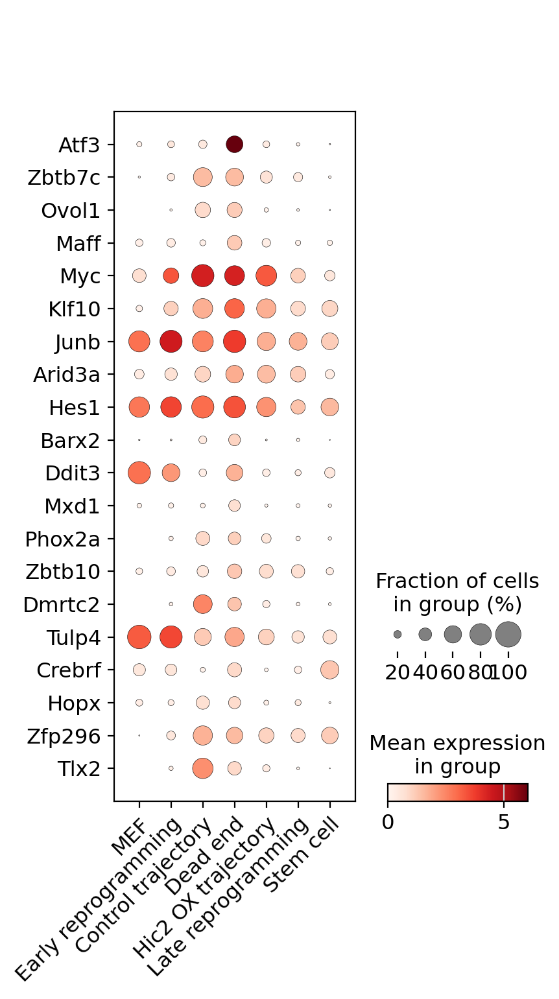

In [15]:
# Most upregulated transcription factors in dead end

top_tfs = rank_dfs["Dead end"].loc[numpy.intersect1d(tf_array, adata.var_names)].sort_values("scores", ascending=False).head(20)
axis = scanpy.pl.dotplot(adata, top_tfs.index, "macrostate", swap_axes=True, show=False)["mainplot_ax"]
axis.set_xticklabels(axis.get_xticklabels(), rotation=45, rotation_mode="anchor", ha="right")
figure = pyplot.gcf()
pyplot.show()


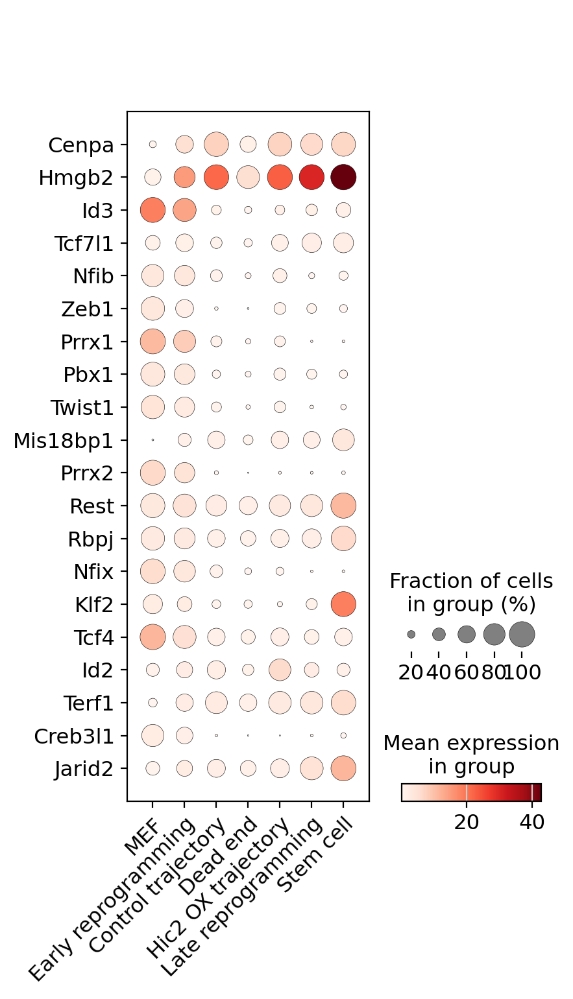

In [16]:
# Most downregulated transcription factors in dead end

top_tfs = rank_dfs["Dead end"].loc[numpy.intersect1d(tf_array, adata.var_names)].sort_values("scores", ascending=True).head(20)
axis = scanpy.pl.dotplot(adata, top_tfs.index, "macrostate", swap_axes=True, show=False)["mainplot_ax"]
axis.set_xticklabels(axis.get_xticklabels(), rotation=45, rotation_mode="anchor", ha="right")
figure = pyplot.gcf()
pyplot.show()


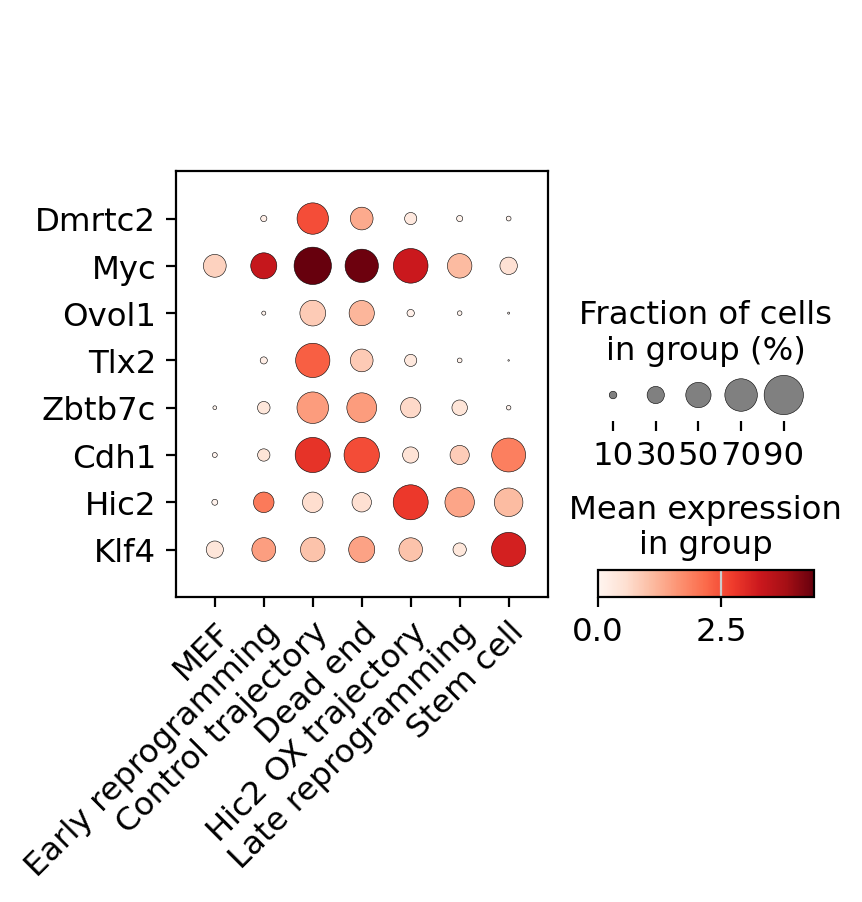

In [17]:
# Dead end driver dot plot

axis = scanpy.pl.dotplot(adata, dead_end_drivers, "macrostate", swap_axes=True, show=False)["mainplot_ax"]
axis.set_xticklabels(axis.get_xticklabels(), rotation=45, rotation_mode="anchor", ha="right")
figure = pyplot.gcf()
pyplot.show()

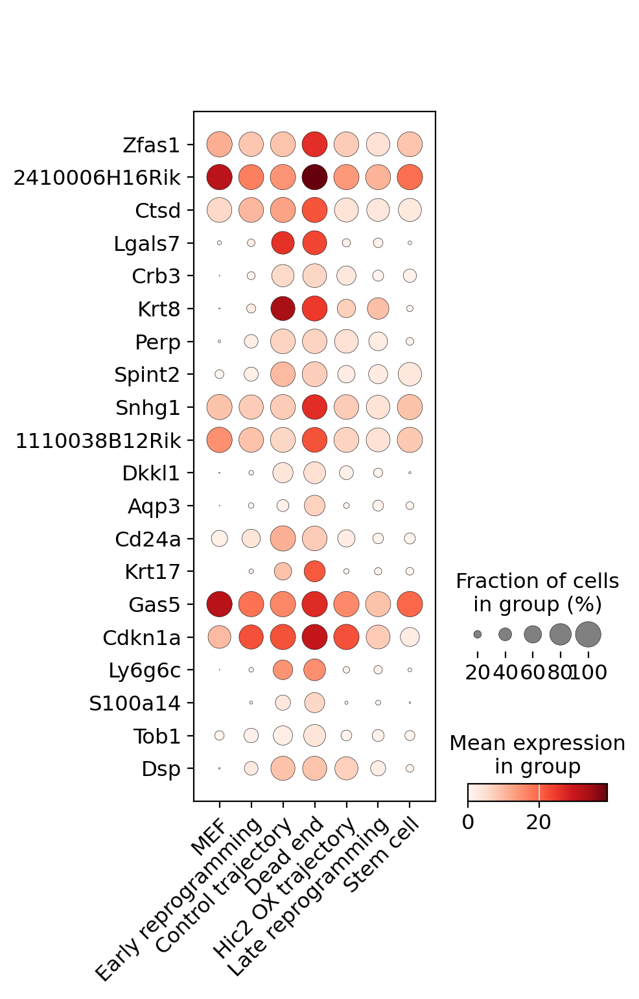

In [18]:
# Most upregulated overall in dead end

top_tfs = rank_dfs["Dead end"].sort_values("scores", ascending=False).head(20)
axis = scanpy.pl.dotplot(adata, top_tfs.index, "macrostate", swap_axes=True, show=False)["mainplot_ax"]
axis.set_xticklabels(axis.get_xticklabels(), rotation=45, rotation_mode="anchor", ha="right")
figure = pyplot.gcf()
pyplot.show()


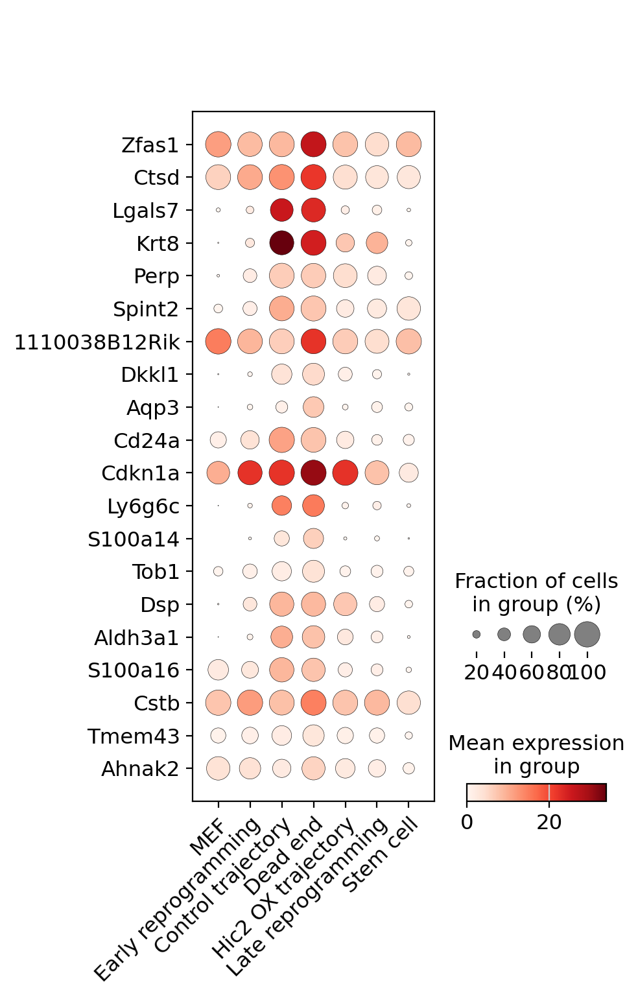

In [19]:
# Most upregulated shared targets in dead end

top_tfs = rank_dfs["Dead end"].loc[numpy.intersect1d(shared_targets, rank_dfs["Dead end"].index)].sort_values("scores", ascending=False).head(20)
axis = scanpy.pl.dotplot(adata, top_tfs.index, "macrostate", swap_axes=True, show=False)["mainplot_ax"]
axis.set_xticklabels(axis.get_xticklabels(), rotation=45, rotation_mode="anchor", ha="right")
figure = pyplot.gcf()
pyplot.show()


2026-03-17 09:53:07,074 [WARNING] Duplicated values found in preranked stats: 2.90% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:07,440 [WARNING] Duplicated values found in preranked stats: 0.05% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:07,823 [WARNING] Duplicated values found in preranked stats: 0.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:08,211 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:08,595 [WARNING] Duplicated values found in preranked stats: 0.75% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:08,980 [WARNING] Duplicated values found in preranked stats: 0.70% of genes
The order of those genes will be

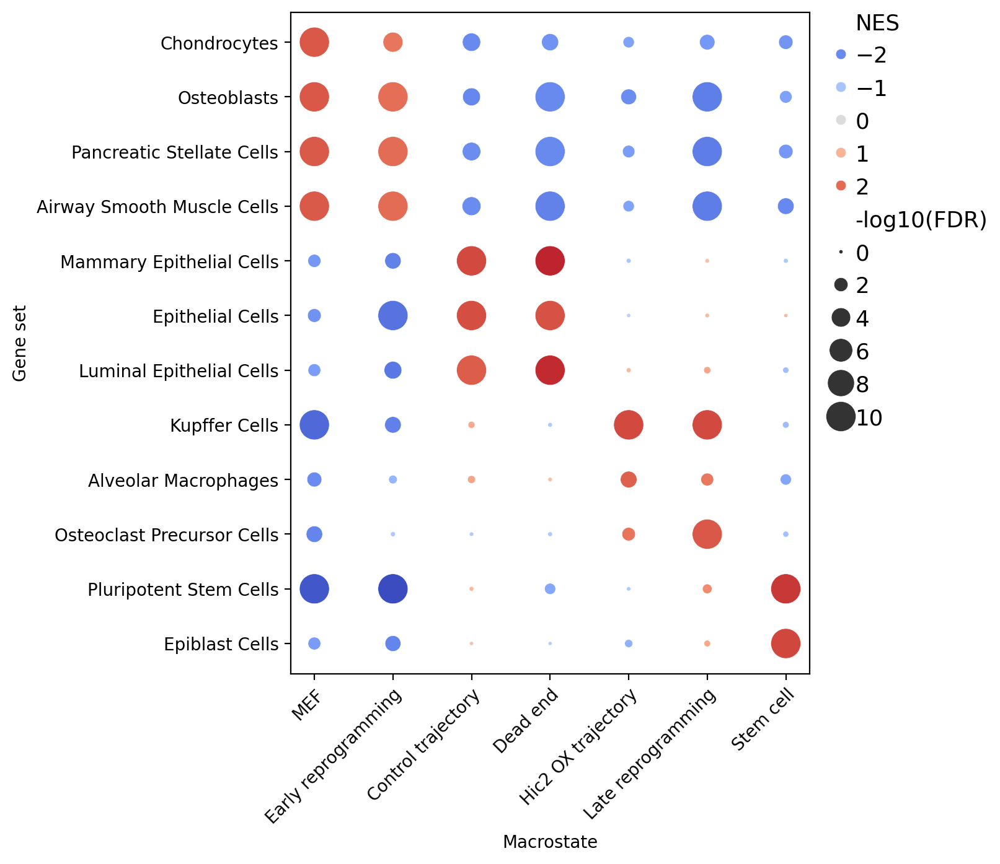

In [20]:
# Cell types

single_cell_analysis.compare_gsea(adata, gene_set="PanglaoDB_Augmented_2021", group_key="macrostate", n_top_terms=2, significance_cutoff=1)

2026-03-17 09:53:12,586 [WARNING] Duplicated values found in preranked stats: 2.90% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:12,924 [WARNING] Duplicated values found in preranked stats: 0.05% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:13,269 [WARNING] Duplicated values found in preranked stats: 0.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:13,671 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:14,090 [WARNING] Duplicated values found in preranked stats: 0.75% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:14,477 [WARNING] Duplicated values found in preranked stats: 0.70% of genes
The order of those genes will be

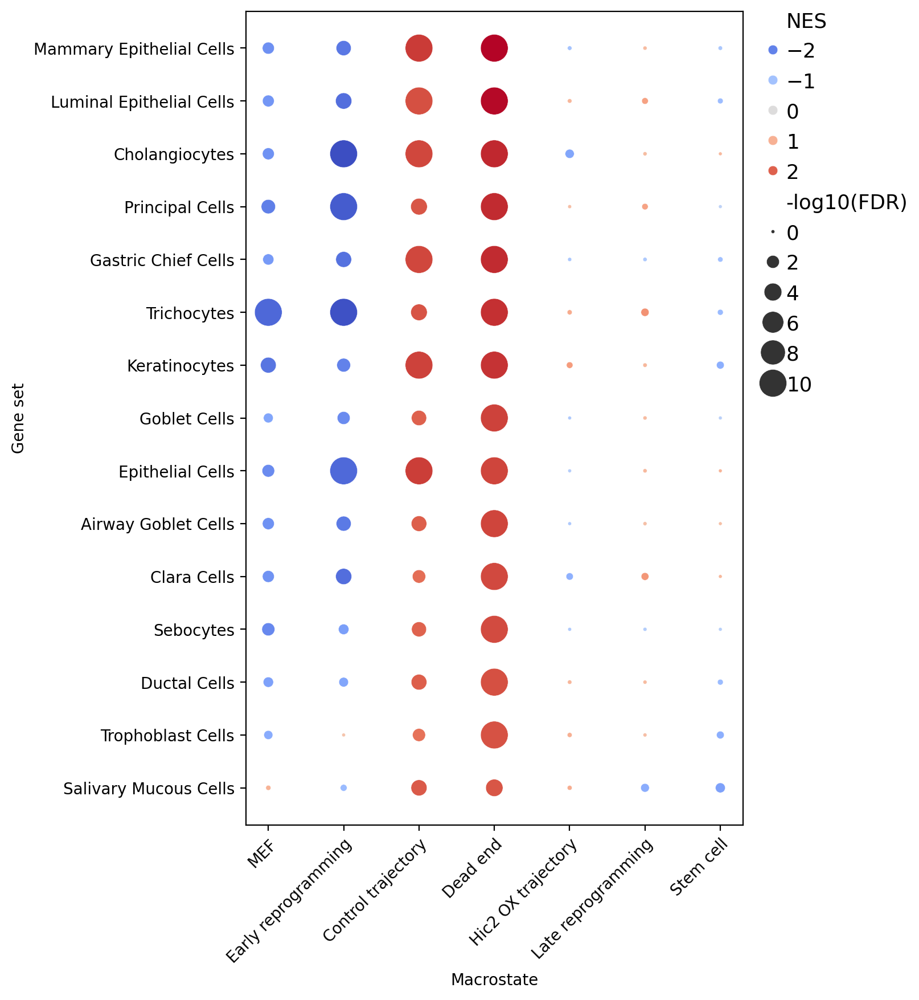

In [21]:
# Cell types in dead end

single_cell_analysis.compare_gsea(adata, gene_set="PanglaoDB_Augmented_2021", group_key="macrostate", top_from="Dead end", n_top_terms=15)

2026-03-17 09:53:18,066 [WARNING] Duplicated values found in preranked stats: 2.90% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:20,472 [WARNING] Duplicated values found in preranked stats: 0.05% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:22,986 [WARNING] Duplicated values found in preranked stats: 0.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:25,422 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:27,826 [WARNING] Duplicated values found in preranked stats: 0.75% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:30,241 [WARNING] Duplicated values found in preranked stats: 0.70% of genes
The order of those genes will be

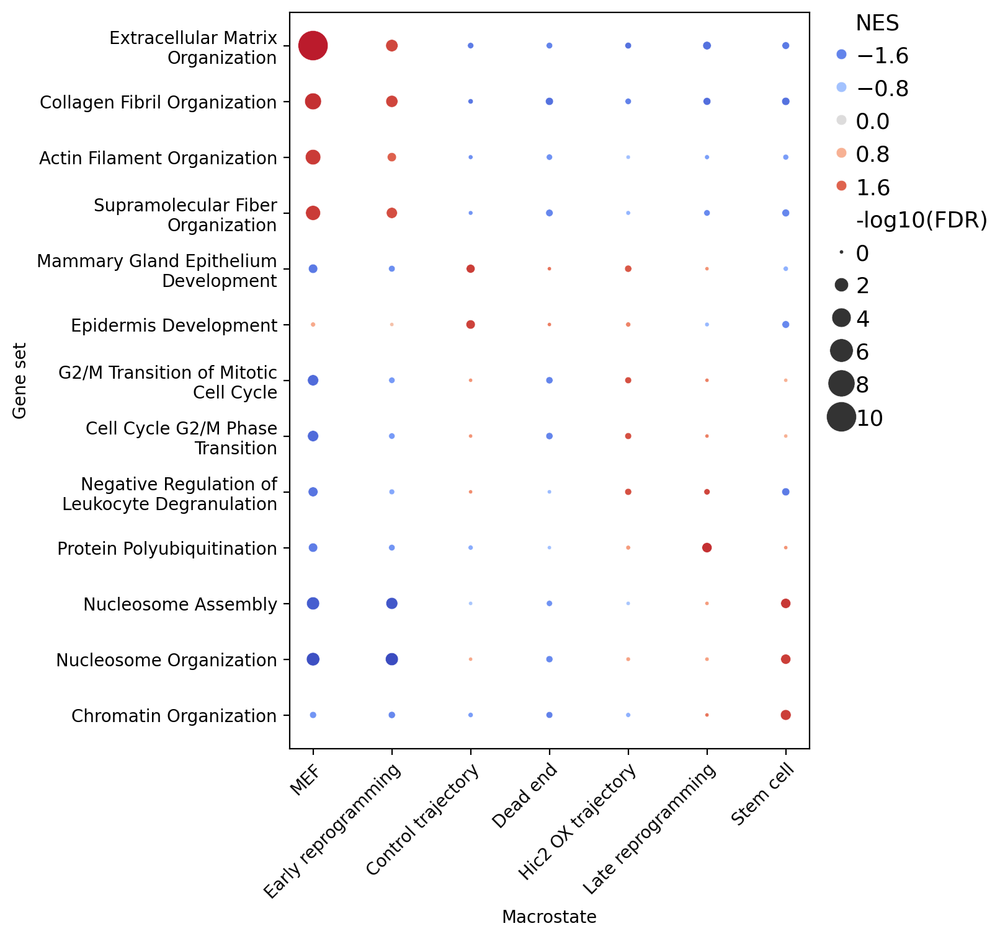

In [22]:
# GO terms

single_cell_analysis.compare_gsea(adata, gene_set="GO_Biological_Process_2025", group_key="macrostate", n_top_terms=3, top_from="all",
                                   significance_cutoff=0.5, remove_parenthesis = True)

2026-03-17 09:53:37,330 [WARNING] Duplicated values found in preranked stats: 2.90% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:39,672 [WARNING] Duplicated values found in preranked stats: 0.05% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:42,113 [WARNING] Duplicated values found in preranked stats: 0.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:44,550 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:46,959 [WARNING] Duplicated values found in preranked stats: 0.75% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:49,374 [WARNING] Duplicated values found in preranked stats: 0.70% of genes
The order of those genes will be

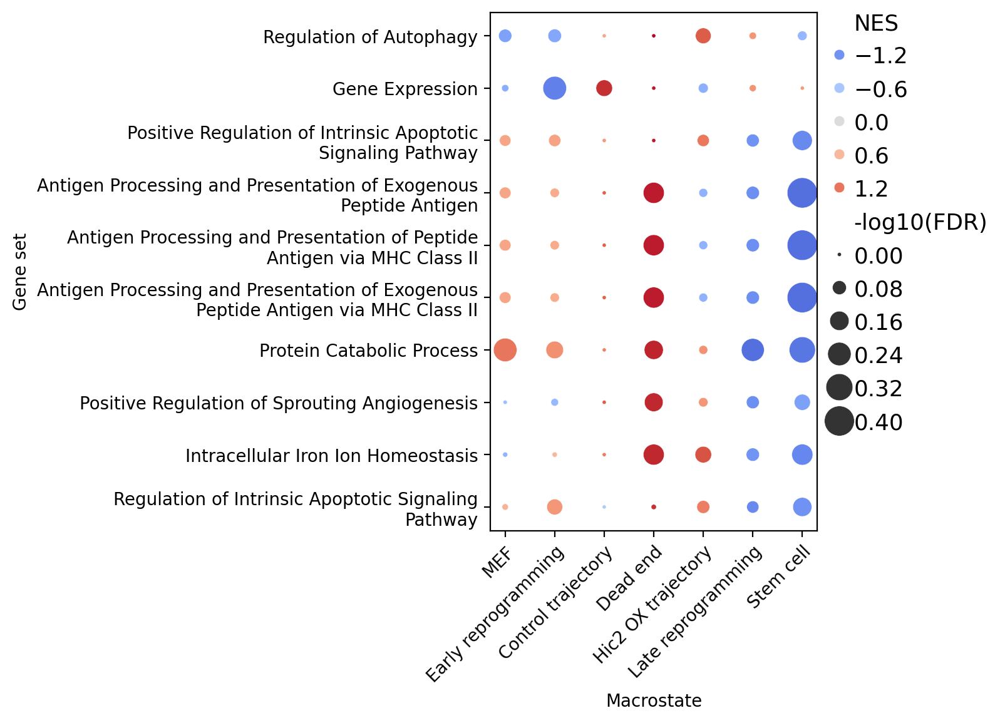

In [23]:
# GO terms in dead end

single_cell_analysis.compare_gsea(adata, gene_set="GO_Biological_Process_2025", group_key="macrostate", n_top_terms=10, top_from="Dead end",
                                   significance_cutoff=1, remove_parenthesis = True, wrap_width=50, sort_key="NES")

In [22]:
from importlib import reload

single_cell_analysis = reload(single_cell_analysis)

2026-03-17 09:53:56,301 [WARNING] Duplicated values found in preranked stats: 2.90% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:56,442 [WARNING] Duplicated values found in preranked stats: 0.05% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:56,586 [WARNING] Duplicated values found in preranked stats: 0.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:56,730 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:56,875 [WARNING] Duplicated values found in preranked stats: 0.75% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:57,020 [WARNING] Duplicated values found in preranked stats: 0.70% of genes
The order of those genes will be

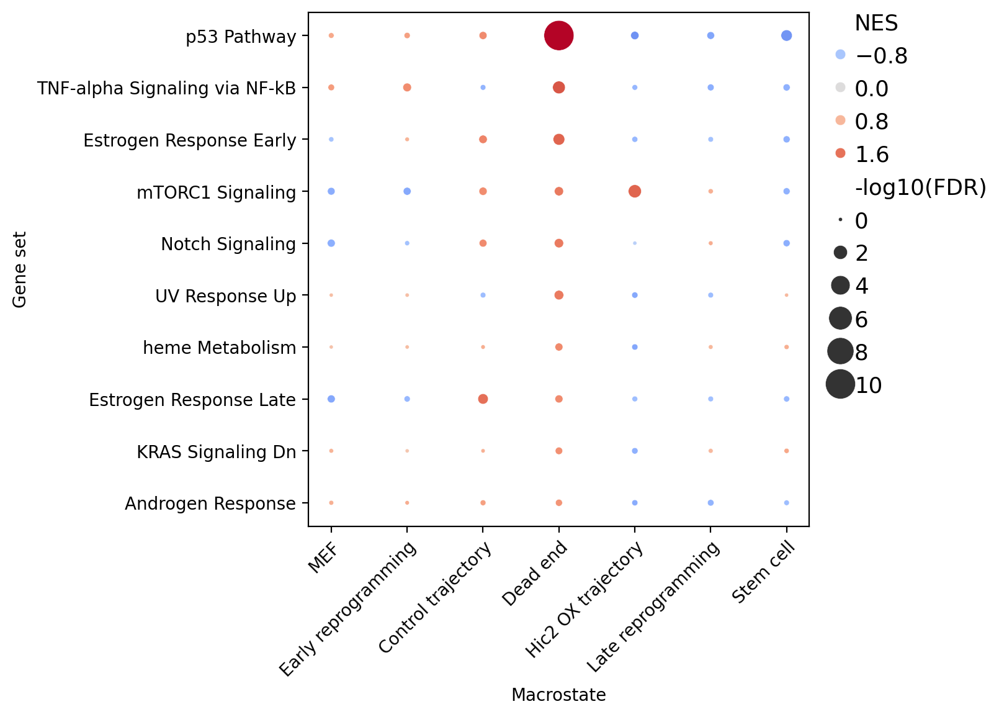

In [25]:
# Msig hallmarks in dead end

single_cell_analysis.compare_gsea(adata, gene_set="MSigDB_Hallmark_2020", group_key="macrostate", n_top_terms=10, top_from="Dead end",
                                   significance_cutoff=0.5, remove_parenthesis = True)

2026-03-17 09:53:59,253 [WARNING] Duplicated values found in preranked stats: 2.90% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:59,394 [WARNING] Duplicated values found in preranked stats: 0.05% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:59,538 [WARNING] Duplicated values found in preranked stats: 0.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:59,684 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:59,829 [WARNING] Duplicated values found in preranked stats: 0.75% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-17 09:53:59,975 [WARNING] Duplicated values found in preranked stats: 0.70% of genes
The order of those genes will be

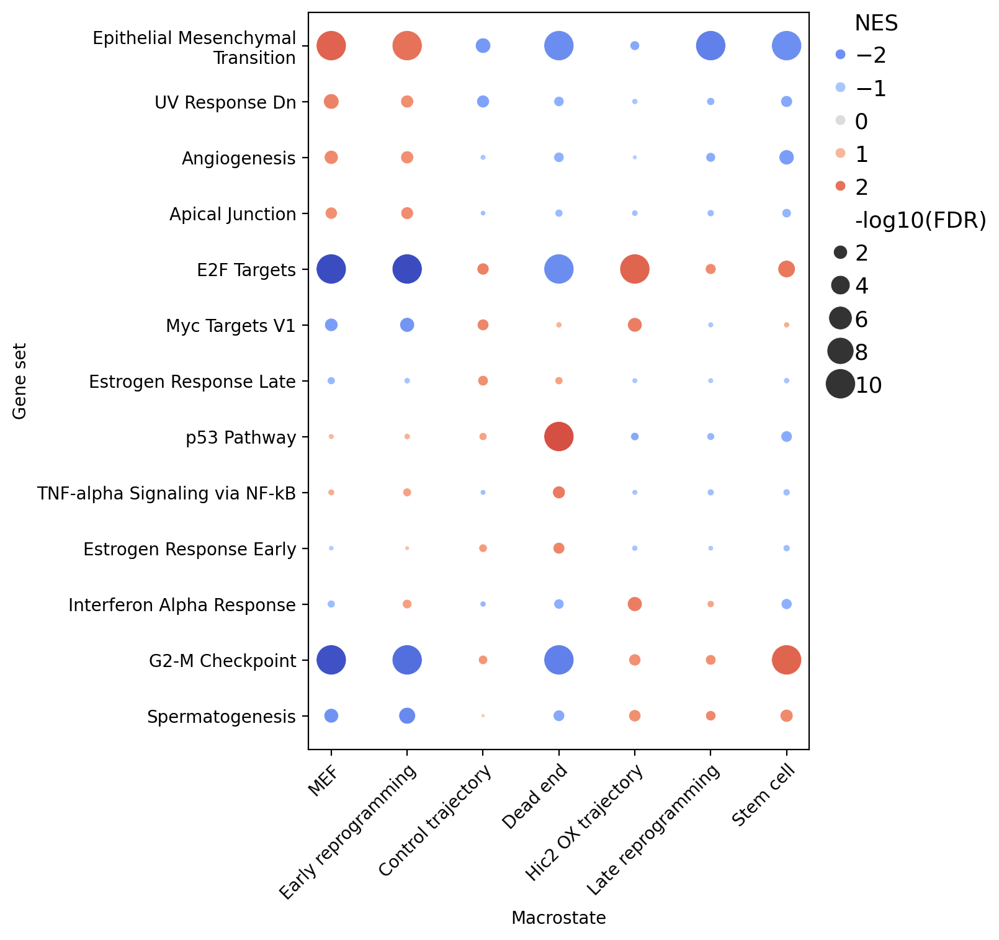

In [26]:
# Msig hallmarks in all

single_cell_analysis.compare_gsea(adata, gene_set="MSigDB_Hallmark_2020", group_key="macrostate", n_top_terms=3, top_from="all",
                                   significance_cutoff=0.1, remove_parenthesis = True)

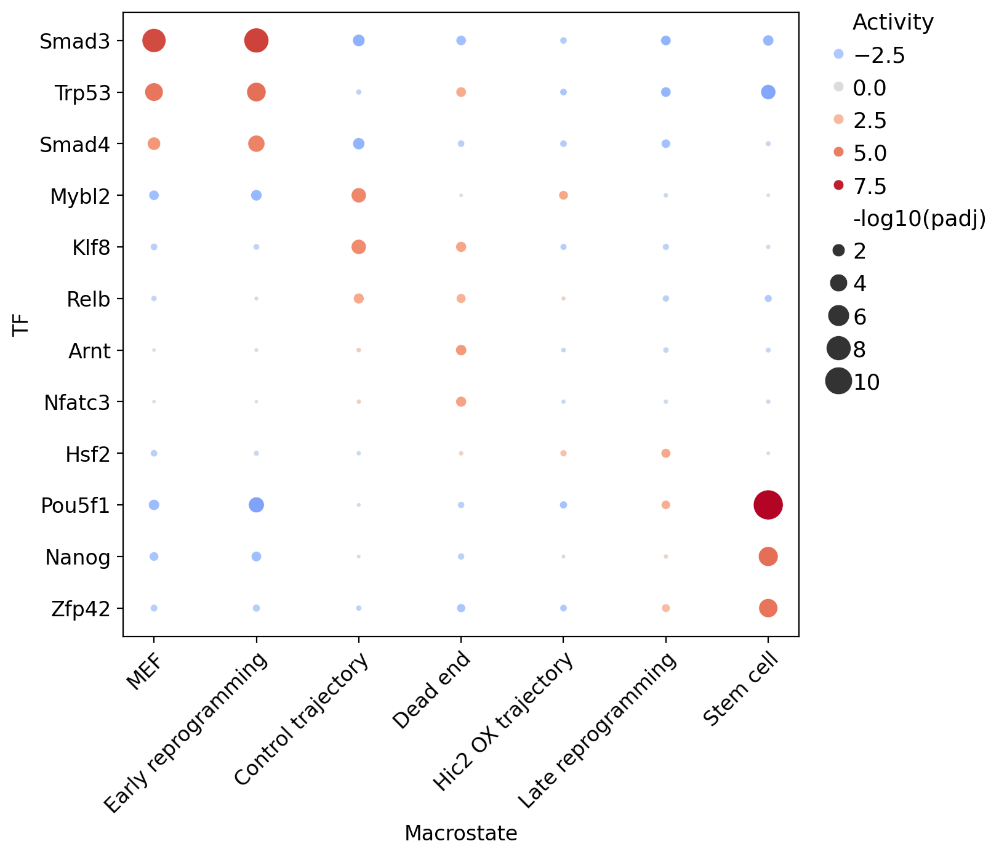

In [27]:
# Compare TFs in macrostates

single_cell_analysis.plot_tf_activity(adata, network=collectri_df, n_top = 3, activity_cutoff = 0, significance_cutoff = 0.1)

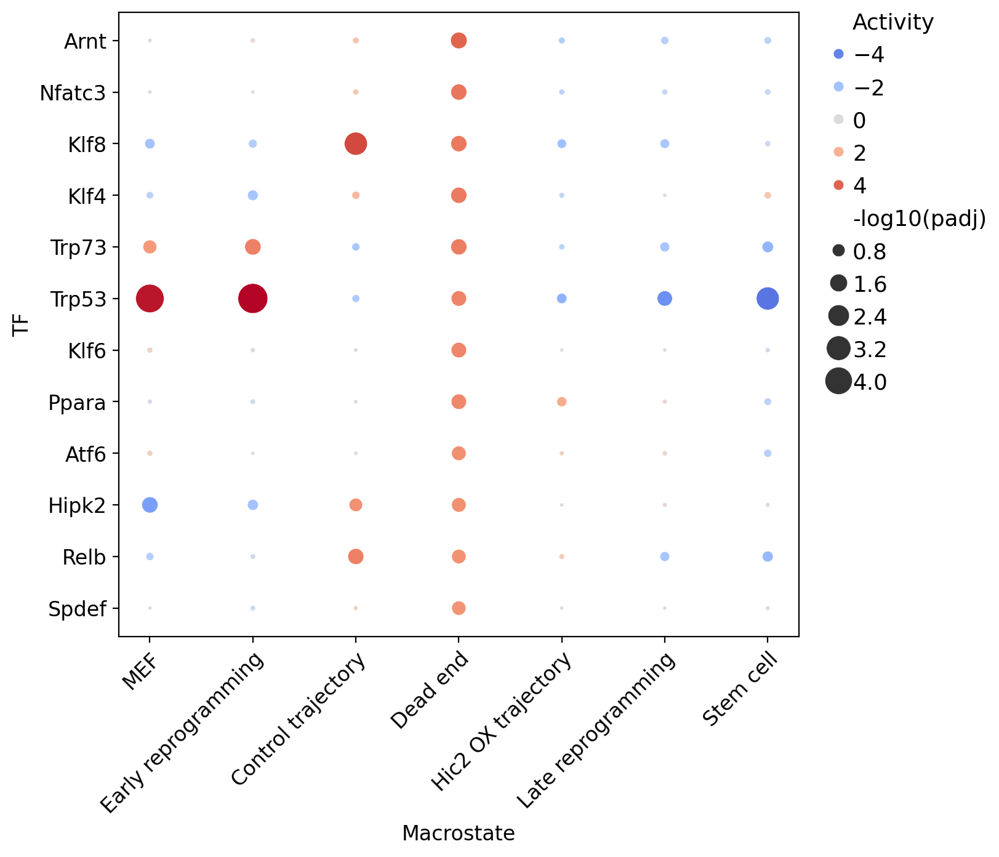

In [28]:
# TFs in dead end

single_cell_analysis.plot_tf_activity(adata, network=collectri_df, n_top = 20, top_from="Dead end", significance_cutoff=0.1, activity_cutoff=0)

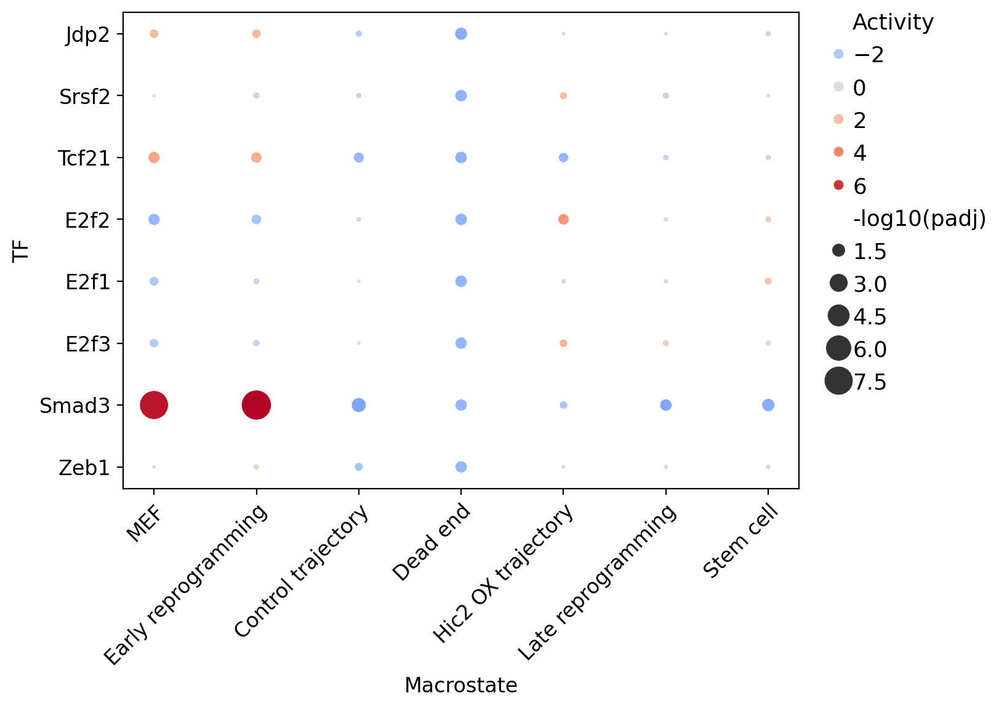

In [29]:
# TFs with low activity in dead end

single_cell_analysis.plot_tf_activity(adata, network=collectri_df, n_top = 20, top_from="Dead end", significance_cutoff=0.1, activity_cutoff=0, reverse=True)

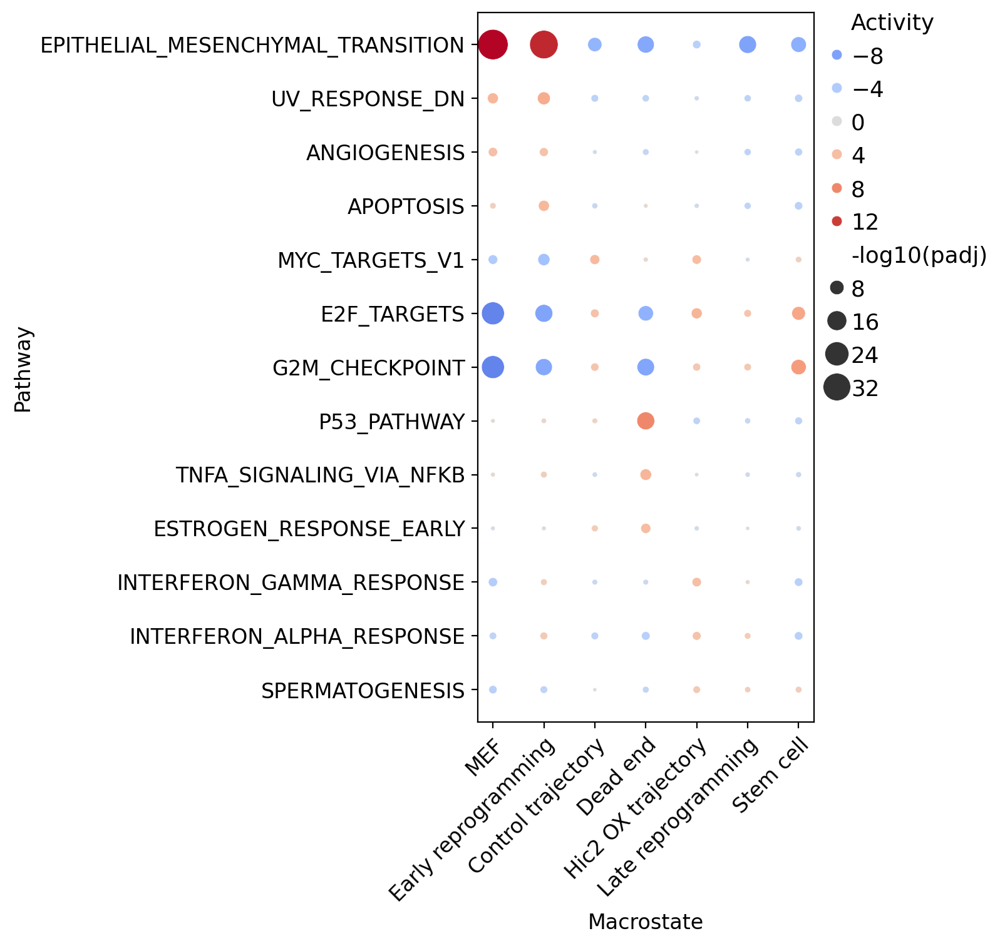

In [30]:
# Pathways in all macrostates

single_cell_analysis.plot_tf_activity(adata, network=hallmark_df, n_top = 3, activity_cutoff = 0, significance_cutoff = 0.1, pathway_key = "Pathway")

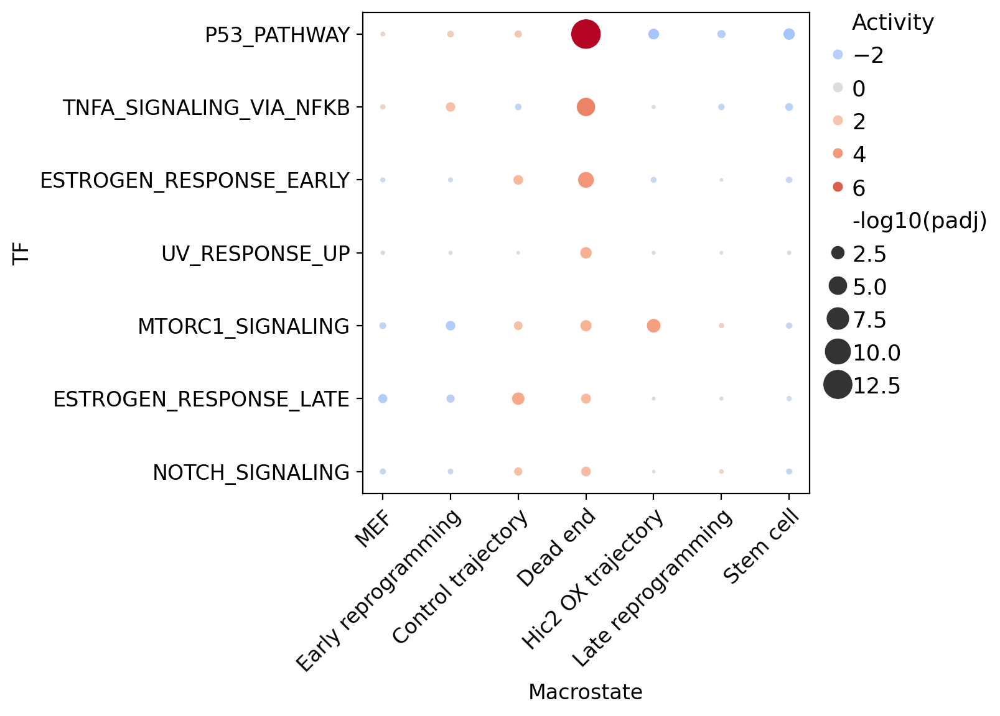

In [31]:
# Pathways in dead end

single_cell_analysis.plot_tf_activity(adata, network=hallmark_df, n_top = 10, top_from="Dead end", significance_cutoff=0.1, activity_cutoff=0)

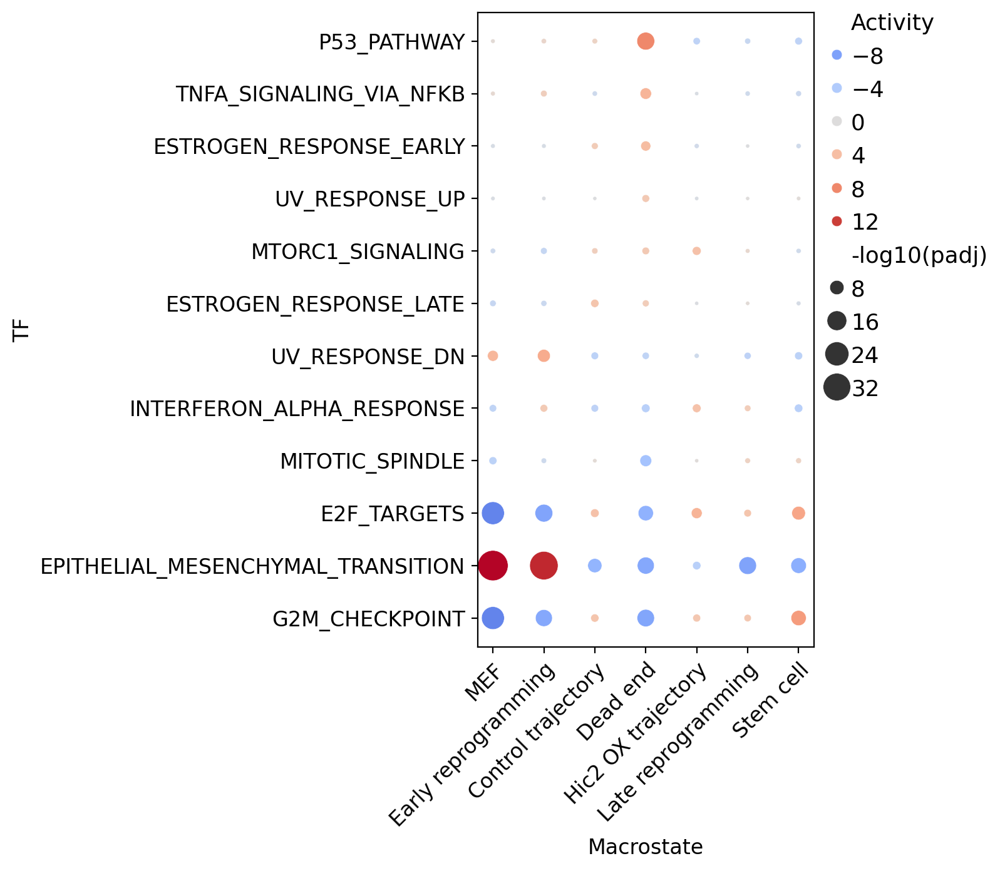

In [32]:
# Significant hallmark pathways

single_cell_analysis.plot_tf_activity(adata, network=hallmark_df, n_top = 20, top_from="Dead end", significance_cutoff=0.05)

## Dead end state

In [33]:
# Most upregulated genes

dead_end_rank_df = rank_dfs["Dead end"]
dead_end_rank_df.head(20)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Zfas1,28.458973,2.232943,3.773779e-178,7.547557e-175
2410006H16Rik,27.454758,1.888420,6.095933e-166,6.095933e-163
Ctsd,26.458736,2.123187,2.894872e-154,1.929915e-151
Lgals7,25.714161,3.957618,8.117870e-146,4.058935e-143
Crb3,25.299303,2.791847,3.251091e-141,1.300436e-138
Krt8,24.376291,3.330821,3.051904e-131,8.719727e-129
Perp,24.088524,2.218825,3.297489e-128,8.243723e-126
Spint2,23.946939,2.108541,9.944225e-127,2.209828e-124
Snhg1,23.873329,2.028821,5.797887e-126,1.159577e-123


In [34]:
# Most upregulated transcription factors in dead end

dead_end_rank_df.loc[numpy.intersect1d(tf_array, adata.var_names)].sort_values("scores", ascending=False).head(30)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Atf3,17.390110,4.089899,9.804607e-68,3.016802e-66
Zbtb7c,14.612451,1.973121,2.339487e-48,3.599212e-47
Ovol1,13.720193,2.777083,7.686031e-43,1.018017e-41
Maff,12.807600,2.751845,1.486617e-37,1.607154e-36
Myc,12.511089,1.459926,6.492776e-36,6.605903e-35
Klf10,12.425893,1.525154,1.891029e-35,1.891029e-34
Junb,11.793038,1.147724,4.239668e-32,3.702767e-31
Arid3a,11.701237,1.506314,1.256091e-31,1.064484e-30
Hes1,10.985732,1.063547,4.475926e-28,3.174415e-27


Really exciting! Many top TFs are involved in stress response, suggesting that this macrostate corresponds to damaged cells.

In [35]:
# Most upregulated transcription factors in dead end that are shared targets

dead_end_rank_df.loc[numpy.intersect1d(target_tfs, adata.var_names)].sort_values("scores", ascending=False).head(30)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Zbtb7c,14.612451,1.973121,2.339487e-48,3.599212e-47
Ovol1,13.720193,2.777083,7.686031e-43,1.018017e-41
Myc,12.511089,1.459926,6.492776e-36,6.605903e-35
Klf10,12.425893,1.525154,1.891029e-35,1.891029e-34
Junb,11.793038,1.147724,4.239668e-32,3.702767e-31
Arid3a,11.701237,1.506314,1.256091e-31,1.064484e-30
Barx2,10.685104,3.323045,1.195144e-26,7.888742e-26
Ddit3,10.194303,1.482505,2.102483e-24,1.266556e-23
Mxd1,9.994449,3.053876,1.611811e-23,9.184110e-23


In [36]:
met_drivers = ["Bmp4", "Bmp7", "Smad1", "Smad5", "Smad8"]
dead_end_rank_df.loc[numpy.intersect1d(met_drivers, dead_end_rank_df.index)]

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Bmp4,-6.972418,-2.947734,3.115390e-12,1.036736e-11


In [37]:
# Most downregulated transcription factors in dead end

dead_end_rank_df.loc[numpy.intersect1d(tf_array, adata.var_names)].sort_values("scores", ascending=True).head(30)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Cenpa,-16.446115,-1.664195,8.942223e-61,2.104052e-59
Hmgb2,-14.552638,-1.363486,5.619370e-48,8.450181e-47
Id3,-13.267100,-2.642051,3.592148e-40,4.276367e-39
Tcf7l1,-11.806723,-1.485039,3.603348e-32,3.160831e-31
Nfib,-11.713265,-2.224971,1.089992e-31,9.356154e-31
Zeb1,-11.589153,-4.036397,4.677352e-31,3.802725e-30
Prrx1,-11.505573,-2.951197,1.236649e-30,9.814671e-30
Pbx1,-10.905756,-2.169205,1.081907e-27,7.565786e-27
Twist1,-10.875159,-2.422398,1.513906e-27,1.051324e-26


In [38]:
dead_end_rank_df.loc[dead_end_drivers].sort_values("scores", ascending=False)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Cdh1,17.346001,1.832915,2.114630e-67,6.312327e-66
Zbtb7c,14.612451,1.973121,2.339487e-48,3.599212e-47
Ovol1,13.720193,2.777083,7.686031e-43,1.018017e-41
Myc,12.511089,1.459926,6.492776e-36,6.605903e-35
Dmrtc2,8.396849,1.533345,4.586215e-17,2.015919e-16
Tlx2,7.353558,1.157640,1.929997e-13,6.905176e-13
Klf4,4.388733,0.652578,1.140128e-05,2.425803e-05
Hic2,-4.371024,-0.510116,1.236653e-05,2.617256e-05


In [39]:
dead_end_rank_df.loc[genes_of_interest].sort_values("scores", ascending=False)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Atf3,17.390110,4.089899,9.804607e-68,3.016802e-66
Cdh1,17.346001,1.832915,2.114630e-67,6.312327e-66
Zbtb7c,14.612451,1.973121,2.339487e-48,3.599212e-47
Ovol1,13.720193,2.777083,7.686031e-43,1.018017e-41
Myc,12.511089,1.459926,6.492776e-36,6.605903e-35
Tlx2,7.353558,1.157640,1.929997e-13,6.905176e-13
Klf4,4.388733,0.652578,1.140128e-05,2.425803e-05
Hic2,-4.371024,-0.510116,1.236653e-05,2.617256e-05
Zfp42,-5.850094,-1.078539,4.912956e-09,1.337761e-08


In [40]:
# Cell types in the dead end

pre_res = gseapy.prerank(
    rnk=dead_end_rank_df[["scores"]], 
    gene_sets="PanglaoDB_Augmented_2021",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-17 09:54:14,430 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,Mammary Epithelial Cells,0.780298,2.66939,0.0,0.0,0.0,21/43,8.25%,Krt8;Perp;Krt17;S100a14;Dsp;S100a16;Lad1;Necti...
1,prerank,Luminal Epithelial Cells,0.779825,2.631357,0.0,0.0,0.0,21/40,8.25%,Crb3;Krt8;Perp;Aqp3;S100a14;Dsp;Lad1;Btg1;Nect...
2,prerank,Cholangiocytes,0.789001,2.498076,0.0,0.0,0.0,15/28,8.10%,Crb3;Krt8;S100a14;Lad1;Cdh1;Mal2;Rab25;St14;Cl...
3,prerank,Principal Cells,0.770034,2.480283,0.0,0.0,0.0,15/31,8.10%,Aqp3;S100a14;Dsp;Lad1;Cdh1;Mal2;Rab25;Cldn7;It...
4,prerank,Gastric Chief Cells,0.858723,2.470227,0.0,0.0,0.0,10/20,3.25%,Crb3;S100a14;Dsp;Lad1;Spint1;Cdh1;Mal2;Rab25;S...
5,prerank,Trichocytes,0.794874,2.436164,0.0,0.0,0.0,17/28,12.90%,Krt8;Perp;Krt17;S100a14;Dsp;S100a16;Lad1;Itgb4...
6,prerank,Keratinocytes,0.731534,2.40409,0.0,0.0,0.0,26/37,20.00%,Lgals7;Perp;Aqp3;Krt17;S100a14;Lad1;Nectin4;It...
7,prerank,Goblet Cells,0.789906,2.285105,0.0,0.0,0.0,9/20,5.90%,Krt8;Aqp3;S100a14;Lad1;Rab25;Cldn7;Misp;Gpx2;E...
8,prerank,Epithelial Cells,0.615117,2.256382,0.0,0.0,0.0,24/66,8.30%,Crb3;Krt8;Aqp3;S100a14;Lad1;Spint1;Nectin4;Cdh...
9,prerank,Airway Goblet Cells,0.777637,2.253971,0.0,0.0,0.0,9/21,5.90%,S100a14;Lad1;Nectin4;Cdh1;Rab25;Cldn7;Misp;Gpx...


In [41]:
# MSig Hallmarks in dead end

pre_res = gseapy.prerank(
    rnk=dead_end_rank_df[["scores"]], 
    gene_sets="MSigDB_Hallmark_2020",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)[["Term", "NES", "FDR q-val", "Lead_genes"]]

2026-03-17 09:54:14,792 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Term,NES,FDR q-val,Lead_genes
0,p53 Pathway,2.379013,0.0,Ctsd;Perp;Krt17;Cdkn1a;Tob1;Ppp1r15a;Btg2;Sat1...
5,TNF-alpha Signaling via NF-kB,1.872878,0.0241,Cdkn1a;Ppp1r15a;Btg2;Sat1;Btg1;Atf3;Sqstm1;Gch...
6,Estrogen Response Early,1.74181,0.045609,Krt8;Aqp3;Tob1;Ablim1;Lad1;Cldn7;Klk10;Myc;Klf...
8,mTORC1 Signaling,1.535319,0.178419,Cdkn1a;Ppp1r15a;Btg2;Ifrd1;Cd9;Sqstm1;Nupr1;Dd...
9,Notch Signaling,1.515761,0.166058,Dtx2;Hes1;Notch1
10,UV Response Up,1.510142,0.14486,Aqp3;Btg2;Btg1;Atf3;Sqstm1;Gch1;Junb;Epcam;Tub...
14,heme Metabolism,1.366562,0.304751,Aqp3;Btg2;Myl4;Ctsb;Mgst3;Lamp2
15,Estrogen Response Late,1.348583,0.295422,Perp;Tob1;Klk11;Cd9;Cdh1;St14;Klk10;Homer2;Lsr...
16,KRAS Signaling Dn,1.287588,0.368673,Lgals7;Btg2;Alox12b
19,Androgen Response,1.235101,0.429916,Krt8;Sat1;Ndrg1;Akap12;Homer2;Zbtb10;B2m;Dnajb...


In [48]:
# Top p53 effectors

pre_res = gseapy.prerank(
    rnk=dead_end_rank_df[["scores"]], 
    gene_sets="MSigDB_Hallmark_2020",
    threads=32,
    min_size=5,
    max_size=1000
)
numpy.array(pre_res.res2d.sort_values("NES", ascending=False).loc[0, ["Lead_genes"]][0].split(";"))

2026-03-17 10:32:05,199 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


array(['Ctsd', 'Perp', 'Krt17', 'Cdkn1a', 'Tob1', 'Ppp1r15a', 'Btg2',
       'Sat1', 'Btg1', 'Atf3', 'Nupr1', 'Ndrg1', 'St14', 'Itgb4', 'Ddit4',
       'Gpx2', 'Ifi30', 'Plk2', 'Pdgfa', 'Notch1', 'Epha2', 'Ddit3',
       'Phlda3', 'Mxd1'], dtype='<U8')

In [138]:
# GO biological process in dead end

pre_res = gseapy.prerank(
    rnk=dead_end_rank_df[["scores"]], 
    gene_sets="GO_Biological_Process_2025",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-16 16:34:56,321 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
1,prerank,Regulation of Autophagy (GO:0010506),0.6476,1.794659,0.002801,1.0,0.797,8/17,14.45%,Sqstm1;Nupr1;Uchl1;Plk2;Ddit3;Hspb1;Rragd;Rb1cc1
6,prerank,Gene Expression (GO:0010467),0.603986,1.738074,0.008671,1.0,0.937,15/21,19.80%,Klk11;Rps18;Klk10;Cisd3;Rps20;Tesc;Klk14;Klk12...
7,prerank,Positive Regulation of Intrinsic Apoptotic Sig...,0.747128,1.736195,0.005222,1.0,0.944,4/10,7.30%,Bbc3;Nupr1;Myc;Ddit3
8,prerank,Antigen Processing and Presentation of Peptide...,0.81367,1.714288,0.015544,0.642978,0.974,3/7,14.35%,Ctsd;Ifi30;Ctsl
9,prerank,Antigen Processing and Presentation of Exogeno...,0.81367,1.714288,0.015544,0.642978,0.974,3/7,14.35%,Ctsd;Ifi30;Ctsl
10,prerank,Antigen Processing and Presentation of Exogeno...,0.81367,1.714288,0.015544,0.642978,0.974,3/7,14.35%,Ctsd;Ifi30;Ctsl
13,prerank,Protein Catabolic Process (GO:0030163),0.59739,1.691452,0.018421,0.697497,0.988,8/18,14.35%,Ctsd;Sqstm1;Ctsz;Uchl1;Ctsb;Mdm2;Lamp2;Ctsl
14,prerank,Positive Regulation of Sprouting Angiogenesis ...,0.764369,1.67657,0.013123,0.707871,0.994,5/8,14.30%,S100a1;Dsg2;Tgm2;Vegfa;Klf4
15,prerank,Intracellular Iron Ion Homeostasis (GO:0006879),0.766541,1.67415,0.031088,0.645494,0.995,5/8,16.40%,Myc;Scara5;B2m;Tfrc;Hmox1
24,prerank,Regulation of Intrinsic Apoptotic Signaling Pa...,0.736073,1.613208,0.028721,0.988172,0.999,4/8,10.20%,Bbc3;Nupr1;Ddit3;Plaur


In [69]:
# TFs whose targets are upregulated in dead end, perturbation followed by expression
pre_res = gseapy.prerank(
    rnk=dead_end_rank_df[["scores"]], 
    gene_sets="TF_Perturbations_Followed_by_Expression",
    threads=32,
    min_size=5,
    max_size=1000
)
print("Top")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=False).head(20))
print("Bottom")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=True).head(20))

2026-03-12 17:00:35,688 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


Top


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
19,prerank,IRF6 KO MOUSE GSE5800 CREEDSID GENE 153 UP,0.586647,2.189804,0.0,0.00071,0.001,27/69,11.60%,Lgals7;Perp;Aqp3;Krt17;Dsp;S100a16;Cstb;Lad1;S...
38,prerank,PPARA KO MOUSE GSE6864 CREEDSID GENE 1371 DOWN,0.557849,2.06888,0.0,0.004617,0.013,29/70,11.55%,Krt8;Spint2;Cdkn1a;Tob1;Lad1;Sat1;Ifrd1;Ubc;Sp...
47,prerank,MYC OE MOUSE GSE55272 CREEDSID GENE 1822 DOWN,0.593377,2.054109,0.0,0.004025,0.017,13/48,7.25%,Lgals7;Perp;Krt17;Ly6g6c;Dsp;Cdh1;Mal2;Fetub;O...
60,prerank,PPARA KO MOUSE GSE6864 CREEDSID GENE 981 UP,0.539017,2.01048,0.0,0.007635,0.042,29/71,11.55%,Krt8;Spint2;Cdkn1a;Tob1;Lad1;Sat1;Ifrd1;Ubc;Sp...
63,prerank,ARID3A KD MOUSE GSE56853 CREEDSID GENE 1337 UP,0.488053,2.002885,0.0,0.006677,0.046,36/140,8.05%,Crb3;Krt8;Perp;Aqp3;Gas5;Cdkn1a;Dsp;Cstb;Btg2;...
80,prerank,NR1I2 KO MOUSE GSE23780 CREEDSID GENE 2165 DOWN,0.704433,1.961165,0.002545,0.00947,0.073,5/17,10.35%,Cdkn1a;Alox12b;Pdlim4;Scara5;Map4k1
145,prerank,AIRE KO MOUSE GSE2585 CREEDSID GENE 272 UP,0.481262,1.856779,0.0,0.034601,0.264,27/87,10.20%,Krt8;Krt17;Cdkn1a;Cstb;Tmem43;Ppp1r15a;Btg2;Sa...
174,prerank,MBD3 KD MOUSE GSE31008 CREEDSID GENE 1325 UP,0.482122,1.820136,0.0,0.047677,0.376,23/73,13.45%,Lgals7;Crb3;Perp;S100a14;Lad1;Mal2;Cldn7;Sdcbp...
197,prerank,ZMAT4 SIRNA T47D HUMAN GSE79586 RNASEQ UP,0.487401,1.783486,0.0,0.062267,0.5,21/60,11.90%,Ctsd;Krt8;Tob1;Ubc;Btg1;Spint1;Sqstm1;St14;Rps...
201,prerank,HEY2 KO MOUSE GSE6526 CREEDSID GENE 1512 DOWN,0.467737,1.776309,0.0,0.054949,0.523,27/83,11.25%,Cdkn1a;S100a16;Cstb;Ppp1r15a;Btg2;Sat1;Ifrd1;U...


Bottom


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,FOXA1 KD HUMAN GSE25315 CREEDSID GENE 2164 DOWN,-0.757504,-2.492661,0.0,0.0,0.0,36/58,10.00%,Ifitm3;Ccnb2;H2afz;Rrm2;Birc5;Lmnb1;Cdk1;Hmmr;...
1,prerank,TAL1 KD JURKAT HUMAN GSE72299 RNASEQ DOWN,-0.82804,-2.432037,0.0,0.0,0.0,21/30,9.20%,Vim;Ccnb2;Actb;H2afz;Rrm2;Birc5;Lmnb1;Cdk1;Mki...
2,prerank,DNMT1 KO MOUSE GSE31626 CREEDSID GENE 1237 DOWN,-0.723677,-2.427432,0.0,0.0,0.0,39/60,17.20%,Vim;Lgals1;Tmsb10;Pfn1;Sh3bgrl3;Actb;Rrm2;Birc...
3,prerank,E2F1 OE HUMAN GSE2715 CREEDSID GENE 1129 DOWN,-0.716645,-2.397369,0.0,0.0,0.0,33/60,8.75%,Vim;Pfn1;Ccnb2;Fn1;Actb;Ccne1;H2afz;Rrm2;Birc5...
4,prerank,DUX4 OE HUMAN GSE33799 CREEDSID GENE 1430 DOWN,-0.722956,-2.349974,0.0,0.0,0.0,30/50,8.75%,Ccnb2;H2afz;Rrm2;Birc5;Lmnb1;Hmmr;Cenpa;Cenpf;...
5,prerank,TFAP2C SIRNA HUMAN GSE15481 CREEDSID GENE 2893...,-0.705627,-2.340536,0.0,0.0,0.0,31/57,13.40%,Ly6e;Rrm2;Birc5;Lmnb1;Cdk1;Mki67;Hmmr;Cenpa;Ce...
6,prerank,MYCN SHRNA SKNBE2 HUMAN GSE84389 RNASEQ DOWN,-0.675887,-2.330449,0.0,0.0,0.0,41/74,12.70%,Lgals1;Pfn1;Marcksl1;Ccnb2;Actb;H2afz;Rrm2;Bir...
7,prerank,ZNF750 KD HUMAN GSE38039 CREEDSID GENE 2704 DOWN,-0.6973,-2.322982,0.0,0.0,0.0,36/61,10.20%,Ifitm3;Ly6e;Arpc1b;Ccnb2;Rrm2;Birc5;Lmnb1;Cdk1...
8,prerank,ZNF750 KD HUMAN GSE38039 CREEDSID GENE 204 UP,-0.6973,-2.322982,0.0,0.0,0.0,36/61,10.20%,Ifitm3;Ly6e;Arpc1b;Ccnb2;Rrm2;Birc5;Lmnb1;Cdk1...
9,prerank,YEATS2 SHRNA H1299 HUMAN GSE90781 RNASEQ DOWN,-0.680359,-2.318801,0.0,0.0,0.0,33/64,7.35%,Vim;Lgals1;Tmsb10;Pfn1;Ccnb2;Actb;H2afz;Rrm2;B...


In [70]:
# TFs whose targets are upregulated in dead end, Chea
pre_res = gseapy.prerank(
    rnk=dead_end_rank_df[["scores"]], 
    gene_sets="ChEA_2022",
    threads=32,
    min_size=5,
    max_size=1000
)
print("Top")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=False).head(30))
print("Bottom")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=True).head(20))

2026-03-12 17:00:49,480 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


Top


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
4,prerank,TP63 17297297 ChIP-ChIP HaCaT Human,0.637686,1.813492,0.005952,0.11841,0.112,11/19,16.15%,Perp;Cdkn1a;Itgb4;Ddit4;Gpx2;Hes1;Notch1;Mdm2;...
14,prerank,RUNX1 27514584 ChIP-Seq MCF-7 Human BreastCancer,0.400518,1.59248,0.003257,0.503488,0.61,29/108,9.70%,Krt8;Tob1;S100a16;Klk11;Lad1;Ubc;Btg1;Gch1;Sma...
15,prerank,TP63 30713093 ChIP-Seq Epithelial Human Tongue...,0.357505,1.587911,0.0,0.347402,0.622,68/256,15.55%,Krt8;Perp;Aqp3;Krt17;Cdkn1a;S100a14;Aldh3a1;S1...
16,prerank,GABP 17652178 ChIP-ChIP JURKAT Human,0.791738,1.586592,0.0489,0.263243,0.625,5/6,14.60%,Ubc;Rps18;Gabarap;Rps20;Ppp1r10
17,prerank,CDX2 20551321 ChIP-Seq CACO-2 Human,0.431256,1.580991,0.006645,0.218619,0.638,25/68,17.20%,Krt8;Tob1;Spint1;Cd9;Dlgap1;St14;Ddit4;Rtn4r;M...
18,prerank,ESR1 26153859 ChIP-Seq MCF-7 Human BreastCancer,0.346766,1.578372,0.0,0.186097,0.644,92/363,12.80%,Krt8;Perp;Spint2;S100a14;Tob1;Dsp;Aldh3a1;S100...
20,prerank,HCFC1 20581084 ChIP-Seq MESCs Mouse,0.783471,1.557881,0.039062,0.189988,0.715,3/6,2.95%,Tmem43;Ifrd1;Rps18
22,prerank,PKCTHETA 26484144 Chip-Seq BREAST Human,0.443477,1.555024,0.022293,0.170154,0.723,16/54,11.75%,Tob1;Tmem43;Bbc3;Btg2;Ubc;Rassf1;Ddit4;Myc;Klf...
29,prerank,FOXA1 33576154 ChIP-Seq Human HilarLN Prostate...,0.390947,1.525798,0.002959,0.188217,0.789,23/94,12.35%,Krt8;Ifrd1;Ubc;Btg1;Atf3;Mal2;Nupr1;Ndrg1;Dusp...
38,prerank,RELB 30642670 ChIP-Seq CTB1 Human Placenta Inf...,0.476745,1.50421,0.053892,0.200808,0.842,14/31,18.20%,Cdkn1a;Tob1;Ppp1r15a;Ddit4;Dusp1;Nfkbia;Cd44;P...


Bottom


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,FOXM1 23109430 ChIP-Seq U2OS Human,-0.704616,-2.2522,0.0,0.0,0.0,32/46,17.50%,Lgals1;Ccnb2;Rrm2;Lmnb1;Cdk1;Mki67;Hmmr;Cenpa;...
1,prerank,FOXM1 25889361 ChIP-Seq OE33 AND U2OS Human,-0.567335,-2.012574,0.0,0.001008,0.002,43/87,19.35%,Lgals1;Arpc1b;Ccnb2;Rrm2;Birc5;Lmnb1;Cdk1;Mki6...
2,prerank,E2F4 17652178 ChIP-ChIP JURKAT Human,-0.594556,-1.974924,0.0,0.001008,0.003,27/57,11.45%,Ccnb2;Rrm2;Birc5;Lmnb1;Mki67;Hmmr;Hells;Cenpa;...
3,prerank,FOXM1 26456572 ChIP-Seq MCF-7 Human BreastCancer,-0.5336,-1.823951,0.0,0.008821,0.035,39/70,23.80%,Ccnb2;Rrm2;Lmnb1;Cdk1;Mki67;Hmmr;Cenpa;Cenpf;T...
5,prerank,EKLF 21900194 ChIP-Seq ERYTHROCYTE Mouse,-0.489624,-1.761209,0.0,0.022381,0.1,34/99,11.80%,Vim;Lgals1;Ly6e;Pfn1;Sh3bgrl3;Arpc1b;Ccne1;Msn...
6,prerank,NANOG 18555785 ChIP-Seq MESCs Mouse,-0.495187,-1.683181,0.001468,0.058304,0.283,38/64,30.15%,Ccne1;Basp1;Top2a;Gsta4;Set;Hmgb2;Mcm3;Gja1;Ub...
7,prerank,SOX2 19030024 ChIP-ChIP MESCs Mouse,-0.479808,-1.677686,0.0,0.054583,0.308,34/84,19.65%,Vim;Basp1;Serpinh1;Gja1;Id3;Fbxo5;Ifitm1;Nfib;...
8,prerank,MYBL2 22936984 ChIP-ChIP MESCs Mouse,-0.425561,-1.674187,0.0,0.049524,0.32,83/197,23.00%,Ifitm3;Ccnb2;Actb;Rrm2;Hmmr;Hells;Top2a;Marcks...
9,prerank,SPI1 22790984 ChIP-Seq ERYTHROLEUKEMIA Mouse,-0.4497,-1.667422,0.001397,0.048502,0.351,35/123,12.05%,Ly6e;Pfn1;Ccnb2;Birc5;Mki67;Hmgn2;Cenpa;Cenpf;...
10,prerank,RUNX2 24655370 ChIP-Seq MC3T3E1 Mouse Bone,-0.397767,-1.655711,0.0,0.05081,0.394,161/374,25.75%,Vim;Ifitm3;Tmsb10;Pfn1;Sh3bgrl3;Arpc1b;Actb;Rr...


In [71]:
# TFs whose targets are upregulated in dead end, ENCODE
pre_res = gseapy.prerank(
    rnk=dead_end_rank_df[["scores"]], 
    gene_sets="ENCODE_TF_ChIP-seq_2015",
    threads=32,
    min_size=5,
    max_size=1000
)
print("Top")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=False).head(30))
print("Bottom")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=True).head(20))

2026-03-12 17:00:55,395 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


Top


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
5,prerank,ZEB1 HepG2 hg19,0.639233,1.949129,0.0,0.013715,0.014,11/27,6.65%,Crb3;Spint1;Cdh1;Mal2;Nupr1;Gsto1;Gpx2;Stx3;Ep...
6,prerank,ATF3 K562 hg19,0.519379,1.872897,0.0,0.020573,0.041,26/62,14.10%,Ctsd;Krt8;Perp;Snhg1;Gas5;Snhg12;Tmem43;Ubc;Dd...
16,prerank,FOSL2 HepG2 hg19,0.513794,1.702567,0.0,0.105804,0.254,15/37,14.10%,Ppp1r15a;Ifrd1;Dusp1;Fam83g;Maff;Klf10;Cd109;E...
18,prerank,NR2F2 MCF-7 hg19,0.497984,1.695798,0.002976,0.084496,0.268,21/45,16.10%,Ctsd;Perp;Gas5;S100a14;Cstb;Ifrd1;Gch1;Sdcbp2;...
19,prerank,YY1 GM12891 hg19,0.496551,1.688826,0.00295,0.072299,0.284,15/42,9.40%,Snhg1;Gas5;Snhg12;Ppp1r15a;Btg1;Zfand5;Taok3;T...
22,prerank,JUND MCF-7 hg19,0.526968,1.682768,0.002941,0.064005,0.294,16/33,16.10%,Krt8;Ifrd1;Ubc;Spint1;Fam83g;Junb;Ahnak;Epcam;...
23,prerank,JUND GM12878 hg19,0.501189,1.673841,0.0,0.06004,0.314,15/41,10.95%,Cstb;Ubc;Atf3;Ctsz;Dusp1;Maff;Ankrd12;Junb;Lsr...
25,prerank,MAX myocyte mm9,0.443407,1.64321,0.003356,0.071393,0.39,22/71,9.15%,2410006H16Rik;Snhg1;1110038B12Rik;Gas5;Tmem43;...
31,prerank,JUND HCT116 hg19,0.46283,1.612532,0.005602,0.084796,0.475,15/50,11.85%,Krt8;Ahnak2;Ablim1;Sat1;Ifrd1;Ubc;Atf3;Ddit4;J...
37,prerank,NR3C1 ECC-1 hg19,0.478355,1.573385,0.008746,0.113935,0.608,14/40,14.25%,Cdkn1a;Ifrd1;Ubc;Hmha1;Ddit4;Dusp1;Klf10;Hes1;...


Bottom


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,FOXM1 ECC-1 hg19,-0.631956,-2.247734,0.0,0.0,0.0,50/89,19.85%,Lgals1;Ccnb2;Rrm2;Birc5;Lmnb1;Cdk1;Mki67;Hmmr;...
1,prerank,E2F4 HeLa-S3 hg19,-0.59808,-2.08807,0.0,0.0,0.0,51/80,20.10%,Ccne1;H2afz;Rrm2;Birc5;Lmnb1;Cdk1;Mki67;Hmgn2;...
2,prerank,E2F4 MEL cell line mm9,-0.679648,-2.058784,0.0,0.0,0.0,29/38,20.10%,2810417H13Rik;Ccne1;Rrm2;Birc5;Lmnb1;Cdk1;Hell...
3,prerank,FOXM1 MCF-7 hg19,-0.684832,-1.998443,0.0,0.0,0.0,17/30,7.50%,Ccnb2;Lmnb1;Cdk1;Mki67;Cenpa;Cenpf;Hmgb2;Plk1;...
4,prerank,SETDB1 U2OS hg19,-0.525005,-1.96114,0.0,0.000403,0.002,54/119,19.20%,Vim;Ccnb2;Birc5;Lmnb1;Cdk1;Hmmr;Cenpa;Cenpf;To...
7,prerank,IRF3 HeLa-S3 hg19,-0.500458,-1.83591,0.0,0.006891,0.039,48/110,17.70%,Ccnb2;Actb;Rrm2;Lmnb1;Cdk1;Myh10;Hmmr;Cenpa;Ce...
8,prerank,NFYA GM12878 hg19,-0.483939,-1.791836,0.0,0.012101,0.078,53/122,22.10%,Lgals1;Ccnb2;Actb;H2afz;Rrm2;Cdk1;Myh10;Hmmr;C...
9,prerank,FOS K562 hg19,-0.481163,-1.787084,0.0,0.011849,0.087,54/120,22.30%,Vim;Ccnb2;Actb;H2afz;Rrm2;Lmnb1;Cdk1;Myh10;Mki...
10,prerank,E2F4 CH12.LX mm9,-0.48642,-1.752786,0.0,0.017927,0.14,52/102,20.10%,2810417H13Rik;Sh3bgrl3;Ccnb2;H2afz;Birc5;Lmnb1...
11,prerank,IRF3 GM12878 hg19,-0.472456,-1.724493,0.0,0.024,0.197,42/105,17.85%,Ccnb2;Actb;H2afz;Rrm2;Cdk1;Hmmr;Cenpa;Cenpf;To...


In [73]:
# Motif enrichment analysis, TRANSFAC and JASPAR

# Motifs upregulated in dead end
pre_res = gseapy.prerank(
    rnk=dead_end_rank_df[["scores"]], 
    gene_sets="TRANSFAC_and_JASPAR_PWMs",
    threads=32,
    min_size=5,
    max_size=1000
)
print("Top")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=False).head(30))
print("Bottom")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=True).head(20))

2026-03-12 17:01:01,788 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


Top


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,SNAI2 (human),0.426263,1.74088,0.0,0.05464,0.157,30/127,8.20%,Crb3;Krt8;Spint2;Aqp3;Krt17;Cdkn1a;Ly6g6c;Cstb...
2,prerank,SNAI1 (human),0.426263,1.74088,0.0,0.05464,0.157,30/127,8.20%,Crb3;Krt8;Spint2;Aqp3;Krt17;Cdkn1a;Ly6g6c;Cstb...
1,prerank,TCF3 (human),0.426263,1.74088,0.0,0.05464,0.157,30/127,8.20%,Crb3;Krt8;Spint2;Aqp3;Krt17;Cdkn1a;Ly6g6c;Cstb...
5,prerank,MIR210 (human),0.64368,1.642511,0.020672,0.102688,0.353,5/13,6.25%,Krt17;S100a14;Aldh3a1;Cd109;Hes1
7,prerank,MAFB (human),0.856199,1.623691,0.009877,0.097208,0.399,2/5,7.80%,Lgals7;Krt16
11,prerank,CEBPB (human),0.355773,1.486462,0.0,0.230313,0.755,34/159,10.70%,Krt8;S100a14;Aldh3a1;Ifrd1;Cdh1;Sqstm1;Mal2;Ra...
17,prerank,TFAP2C (human),0.339036,1.428918,0.0,0.294619,0.869,32/160,9.50%,Spint2;Aqp3;Aldh3a1;Ahnak2;Ablim1;Sqstm1;Rassf...
22,prerank,JUN (mouse),0.317986,1.370225,0.003584,0.377514,0.947,39/172,13.30%,Ppp1r15a;Ablim1;Btg2;Mal2;Rab25;St14;S100a13;T...
25,prerank,MYOD1 (human),0.578233,1.357053,0.128788,0.365323,0.964,5/10,11.35%,Dlgap1;Epcam;Renbp;Kiss1r;Fbxo32
28,prerank,NCOA1 (human),0.596756,1.343655,0.130326,0.357477,0.972,2/8,4.90%,S100a14;Akap12


Bottom


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
3,prerank,Nkx2-5 (mouse),-0.543455,-1.729987,0.001481,0.087655,0.081,26/43,38.00%,Ly6e;Fn1;Ctgf;Maged2;Tfpi;Fbxo15;Gpc3;Mgmt;Sh3...
4,prerank,HNF1B (human),-0.712663,-1.645343,0.009709,0.139128,0.233,5/12,6.95%,Sparc;Aes;Cald1;Spp1;Gpx1
6,prerank,SOX10 (human),-0.639676,-1.633604,0.01129,0.110079,0.269,8/17,23.35%,Cenpm;Tln1;Id3;Enah;Col11a1;Tdrd12;Bdnf;Upp1
8,prerank,NFYA (mouse),-0.436698,-1.620879,0.0,0.098867,0.308,66/125,34.70%,Ccnb2;Msn;Basp1;Mki67;Hmmr;Top2a;Marcks;Nusap1...
9,prerank,HIVEP1 (human),-0.535272,-1.501309,0.025276,0.326567,0.786,13/26,24.15%,Glipr2;Nfib;Gstm2;Col5a1;Rbpj;Copz2;Fbxo15;Anx...
10,prerank,NRF1 (human),-0.430654,-1.489062,0.010219,0.308663,0.829,15/70,11.00%,Pfn1;Cdk1;Hmmr;Cenpf;Nt5dc2;Set;Blvrb;Fbxo5;G3...
12,prerank,NFYB (human),-0.721217,-1.480504,0.040193,0.288739,0.854,6/8,13.15%,Actb;Cdk1;Top2a;Col1a1;Mme;Gpc3
13,prerank,NFYA (human),-0.36395,-1.471291,0.002618,0.281185,0.885,93/249,27.90%,Mki67;Hmmr;Cenpa;Top2a;Serpinh1;Vcan;Col1a1;Ma...
15,prerank,NFYB (mouse),-0.388158,-1.434503,0.007267,0.326262,0.947,53/119,30.85%,Ccnb2;Basp1;Hmmr;Marcks;Nusap1;Rbpms2;Esco2;Ig...
14,prerank,CPEB1 (mouse),-0.388158,-1.434503,0.007267,0.326262,0.947,53/119,30.85%,Ccnb2;Basp1;Hmmr;Marcks;Nusap1;Rbpms2;Esco2;Ig...


In [74]:
# TF activity in dead end CollecTRI

data = dead_end_rank_df[["scores"]].T.dropna(axis=1)
tf_acts, tf_padj = decoupler.mt.ulm(data=data, net=collectri_df)
activities_df = pandas.DataFrame(data={"Activity": tf_acts.transpose()["scores"], "Adjusted p-value": tf_padj.transpose()["scores"]}, index=tf_acts.columns)
activities_df.sort_values("Activity", ascending=False).head(30)

,Activity,Adjusted p-value
Arnt,3.934093,0.039641
Nfatc3,3.574759,0.049401
Klf8,3.466975,0.049401
Klf4,3.441125,0.049401
Trp73,3.417032,0.049401
Trp53,3.212393,0.064336
Klf6,3.171068,0.064336
Ppara,3.138468,0.065093
Atf6,2.946006,0.087920
Hipk2,2.928162,0.087932


In [75]:
# Most downregulated in dead end

activities_df.sort_values("Activity", ascending=True).head(25)

,Activity,Adjusted p-value
Jdp2,-3.527498,0.049401
Srsf2,-3.294341,0.064336
Tcf21,-3.231958,0.064336
E2f2,-3.185670,0.064336
E2f1,-3.118510,0.065093
E2f3,-3.070201,0.068303
Smad3,-3.045057,0.068303
Zeb1,-3.041970,0.068303
Ovol1,-2.706844,0.142925
Zfp42,-2.671403,0.151965


In [76]:
# Progeny pathways in dead end

data = dead_end_rank_df[["scores"]].T.dropna(axis=1)
tf_acts, tf_padj = decoupler.mt.ulm(data=data, net=progeny_df)
activities_df = pandas.DataFrame(data={"Activity": tf_acts.transpose()["scores"], "Adjusted p-value": tf_padj.transpose()["scores"]}, index=tf_acts.columns)

IPython.display.display(activities_df.sort_values("Activity", ascending=False))

,Activity,Adjusted p-value
p53,10.951434,5.321759e-26
Hypoxia,4.178414,1.428918e-04
Trail,2.686458,2.038742e-02
VEGF,2.521604,2.743835e-02
NFkB,2.185649,5.067476e-02
TNFa,1.733687,1.163790e-01
EGFR,0.648331,5.805006e-01
Androgen,0.371444,7.103462e-01
WNT,-0.614377,5.805006e-01
MAPK,-0.763198,5.669181e-01


In [77]:
# Hallmark pathways in dead end

data = dead_end_rank_df[["scores"]].T.dropna(axis=1)
tf_acts, tf_padj = decoupler.mt.ulm(data=data, net=hallmark_df)
activities_df = pandas.DataFrame(data={"Activity": tf_acts.transpose()["scores"], "Adjusted p-value": tf_padj.transpose()["scores"]}, index=tf_acts.columns)

print("Top")
IPython.display.display(activities_df.sort_values("Activity", ascending=False).head(20))
print("Bottom")
IPython.display.display(activities_df.sort_values("Activity", ascending=True).head(20))

Top


,Activity,Adjusted p-value
P53_PATHWAY,7.966988,1.325650e-13
TNFA_SIGNALING_VIA_NFKB,4.831067,1.193465e-05
ESTROGEN_RESPONSE_EARLY,4.151788,2.406289e-04
UV_RESPONSE_UP,3.005806,1.460072e-02
MTORC1_SIGNALING,2.906035,1.813342e-02
ESTROGEN_RESPONSE_LATE,2.541342,4.539762e-02
NOTCH_SIGNALING,2.472664,5.086080e-02
HYPOXIA,2.132064,1.014398e-01
HEME_METABOLISM,2.076899,1.054663e-01
ANDROGEN_RESPONSE,1.901833,1.404749e-01


Bottom


,Activity,Adjusted p-value
G2M_CHECKPOINT,-7.701148,5.161268e-13
EPITHELIAL_MESENCHYMAL_TRANSITION,-7.472386,1.912550e-12
E2F_TARGETS,-6.633865,5.141658e-10
MITOTIC_SPINDLE,-5.025086,5.370551e-06
INTERFERON_ALPHA_RESPONSE,-3.442545,3.602344e-03
UV_RESPONSE_DN,-2.724771,2.891313e-02
SPERMATOGENESIS,-2.369579,6.266005e-02
ANGIOGENESIS,-2.275600,7.505298e-02
GLYCOLYSIS,-2.068273,1.054663e-01
APICAL_JUNCTION,-1.984505,1.220775e-01


## Reactome pathway

In [165]:
msigdb = decoupler.op.resource("MSigDB", organism='mouse', license='academic', verbose=False)

# Get reactome pathways
reactome = msigdb.query("collection == 'reactome_pathways'")
# Filter duplicates
reactome = reactome[~reactome.duplicated(("geneset", "genesymbol"))]


KeyboardInterrupt: 

In [ ]:
# Give source and target column
reactome = reactome.rename(columns={"geneset": "source", "genesymbol": "target"})

In [162]:
"Ovol1" in reactome["source"].to_list()

False

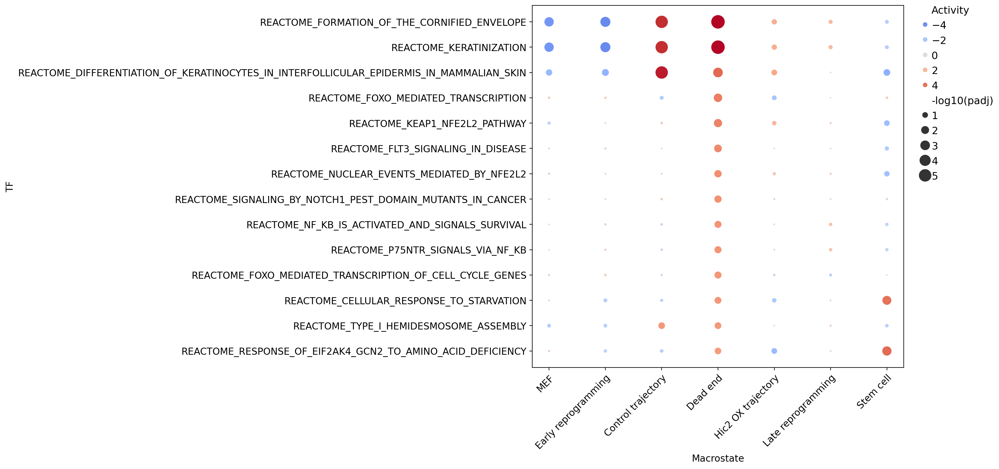

In [174]:
single_cell_analysis.plot_tf_activity(adata, network=reactome, n_top = 20, top_from="Dead end", significance_cutoff=0.05, activity_cutoff=0, reverse=False)

## Day 4 control

In [82]:
# Most upregulated transcription factors in day 4 control

control_rank_df = rank_dfs["Control trajectory"]
control_rank_df.loc[numpy.intersect1d(tf_array, adata.var_names)].sort_values("scores", ascending=False).head(30)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Tlx2,55.942142,3.916461,0.000000e+00,0.000000e+00
Dmrtc2,48.712059,3.738403,0.000000e+00,0.000000e+00
Hmgb3,43.440643,1.698694,0.000000e+00,0.000000e+00
Zbtb7c,38.602940,2.056504,0.000000e+00,0.000000e+00
Ovol1,36.529839,3.073048,3.726850e-292,5.962960e-291
Myc,35.844555,1.423120,2.235676e-281,3.336830e-280
Zbtb32,35.389317,2.103203,2.493030e-274,3.613088e-273
Hoxa9,27.507351,1.603607,1.433879e-166,1.129038e-165
Phox2a,26.728016,2.065740,2.224474e-157,1.653884e-156


In [83]:
# Cell types in control

pre_res = gseapy.prerank(
    rnk=control_rank_df[["scores"]], 
    gene_sets="PanglaoDB_Augmented_2021",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-12 17:03:19,964 [WARNING] Duplicated values found in preranked stats: 0.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,Mammary Epithelial Cells,0.726041,2.353776,0.0,0.0,0.0,18/43,7.65%,Krt8;S100a16;Perp;Lad1;Dsp;Misp;Itgb4;Gjb3;Cdh...
1,prerank,Epithelial Cells,0.667829,2.321808,0.0,0.0,0.0,32/66,16.70%,Krt8;Crb3;Lad1;Gpx2;Misp;Krt13;Itgb4;Gjb3;St14...
2,prerank,Keratinocytes,0.729877,2.27398,0.0,0.0,0.0,21/37,14.75%,Lgals7;Perp;Lad1;Anxa8;Krt13;Gjb5;Itgb4;Gjb3;K...
3,prerank,Cholangiocytes,0.756215,2.234771,0.0,0.0,0.0,14/28,7.30%,Krt8;Crb3;Lad1;Gpx2;Misp;Itgb4;St14;Cdh1;Ovol1...
4,prerank,Gastric Chief Cells,0.808528,2.233007,0.0,0.0,0.0,13/20,11.85%,Tppp3;Crb3;Lad1;Dsp;Itgb4;St14;Cdh1;S100a14;Ma...
5,prerank,Luminal Epithelial Cells,0.666873,2.162243,0.0,0.0,0.0,24/40,14.75%,Krt8;Perp;Crb3;Lad1;Dsp;Misp;Itgb4;Gjb3;St14;C...
6,prerank,Trichocytes,0.722284,2.109259,0.0,0.000362,0.002,16/28,16.30%,Krt8;S100a16;Perp;Lad1;Dsp;Misp;Itgb4;Gjb3;Krt...
7,prerank,Principal Cells,0.709534,2.091938,0.0,0.000317,0.002,18/31,14.55%,Lad1;Dsp;Itgb4;Cdh1;Zbtb7c;Ovol1;S100a14;Mal2;...
9,prerank,Salivary Mucous Cells,0.69144,2.060422,0.0,0.000564,0.004,16/28,14.75%,Lgals7;Anxa8;Gjb5;Gjb3;Krt17;Klk11;S100a14;Krt...
11,prerank,Hepatoblasts,0.780984,2.045621,0.002353,0.000507,0.004,11/17,11.30%,Krt8;Lad1;Dsp;Cdh1;S100a14;Mal2;Krt14;Epcam;Ch...


In [86]:
# TF activity in day 4 control, CollecTRI

data = control_rank_df[["scores"]].T.dropna(axis=1)
tf_acts, tf_padj = decoupler.mt.ulm(data=data, net=collectri_df)
activities_df = pandas.DataFrame(data={"Activity": tf_acts.transpose()["scores"], "Adjusted p-value": tf_padj.transpose()["scores"]}, index=tf_acts.columns)
print("Top")
IPython.display.display(activities_df.sort_values("Activity", ascending=False).head(30))
print("Bottom")
IPython.display.display(activities_df.sort_values("Activity", ascending=True).head(30))

Top


,Activity,Adjusted p-value
Mybl2,4.599202,0.001579
Klf8,4.509352,0.001579
Relb,3.334902,0.049853
Hipk2,2.932453,0.130097
Kmt2a,2.456720,0.292467
Sox17,2.448504,0.292467
Hoxb2,2.427470,0.292467
Hoxa1,2.197927,0.402610
Myog,2.178406,0.410212
Tbpl1,2.071291,0.477760


Bottom


,Activity,Adjusted p-value
Thrb,-3.866687,0.015644
Smad3,-3.822165,0.015644
Atf3,-3.737088,0.017570
Smad4,-3.666442,0.019307
Ovol1,-3.497383,0.031482
Foxo3,-3.060823,0.108498
Pgr,-3.044154,0.108498
Tcf21,-2.952813,0.130097
Hdgf,-2.826344,0.167892
Smad2,-2.733381,0.203894


## Other macrostates

### MEF

In [87]:
mef_rank_df = rank_dfs["MEF"]
mef_rank_df.loc[numpy.intersect1d(target_tfs, adata.var_names)].sort_values("scores", ascending=False).head(20)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Tcf4,16.912788,3.044201,3.621573e-64,4.315809e-62
Foxp1,15.659682,2.198975,2.853173e-55,1.141269e-53
Nfix,15.468977,3.057416,5.619277e-54,1.937682e-52
Prrx1,15.239464,3.389935,1.934523e-52,5.607313e-51
Snai2,15.092698,3.983426,1.808906e-51,4.579509e-50
Id3,14.192972,3.268758,1.012735e-45,1.687891e-44
Twist1,13.442369,2.745772,3.413279e-41,4.320606e-40
Creb3l1,12.764838,2.859763,2.576856e-37,2.831709e-36
Atf5,12.281153,2.036144,1.143576e-34,1.099593e-33


In [88]:
mef_rank_df.loc[genes_of_interest].sort_values("scores", ascending=False).head(20)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Rest,1.034993,0.090605,3.006723e-01,4.071391e-01
Atf3,-0.850470,-0.761129,3.950637e-01,5.194788e-01
Tcf7l1,-1.469350,-0.273494,1.417380e-01,2.049718e-01
Ovol1,-3.300071,-27.187889,9.666050e-04,1.813518e-03
Klf4,-4.045541,-1.227806,5.220240e-05,1.119022e-04
Myc,-4.553360,-1.138258,5.279583e-06,1.237886e-05
Tlx2,-4.845558,-28.158657,1.262562e-06,3.109758e-06
Zbtb7c,-5.551108,-3.271875,2.838638e-08,7.745260e-08
Jarid2,-7.320465,-1.931451,2.471139e-13,8.825497e-13


In [89]:
# Cell types

pre_res = gseapy.prerank(
    rnk=mef_rank_df[["scores"]], 
    gene_sets="PanglaoDB_Augmented_2021",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-12 17:04:13,914 [WARNING] Duplicated values found in preranked stats: 2.90% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
4,prerank,Chondrocytes,0.717302,2.199177,0.0,0.0,0.0,52/94,14.55%,Col12a1;Tnc;Col5a2;Ccdc80;Col5a1;Col3a1;Fstl1;...
5,prerank,Osteoblasts,0.703637,2.19525,0.0,0.0,0.0,56/100,16.60%,Col12a1;Tnc;Col5a2;Ccdc80;Col5a1;Col3a1;Fstl1;...
6,prerank,Pancreatic Stellate Cells,0.715905,2.182292,0.0,0.0,0.0,53/80,19.05%,Col12a1;Tnc;Col5a2;Ccdc80;Col5a1;Col3a1;Fstl1;...
7,prerank,Airway Smooth Muscle Cells,0.731724,2.177225,0.0,0.0,0.0,46/70,17.10%,Col12a1;Col5a2;Col5a1;Col3a1;Fstl1;Col1a1;Col1...
8,prerank,Myofibroblasts,0.730044,2.169754,0.0,0.0,0.0,44/70,14.55%,Col12a1;Col5a2;Ccdc80;Col5a1;Col3a1;Fstl1;Col1...
9,prerank,Mesangial Cells,0.696353,2.157533,0.0,0.0,0.0,56/95,19.05%,Col12a1;Col5a2;Ccdc80;Col5a1;Col3a1;Fstl1;Col1...
11,prerank,Smooth Muscle Cells,0.693603,2.11507,0.0,0.0,0.0,46/87,14.55%,Col12a1;Col5a2;Ccdc80;Col5a1;Col3a1;Fstl1;Col1...
12,prerank,Myoblasts,0.707584,2.10692,0.0,0.0,0.0,35/61,17.15%,Col12a1;Col5a2;Col5a1;Col3a1;Fstl1;Col1a1;Col1...
13,prerank,Fibroblasts,0.65629,2.104692,0.0,0.0,0.0,87/140,25.60%,Col12a1;Cthrc1;Col5a2;Ccdc80;Col5a1;Col3a1;Fst...
14,prerank,Vascular Smooth Muscle Cells,0.703739,2.101591,0.0,0.0,0.0,53/71,25.50%,Col12a1;Col5a2;Ccdc80;Col5a1;Col3a1;Fstl1;Col1...


### Day 2 control

In [91]:
early_rank_df = rank_dfs["Early reprogramming"]
early_rank_df.loc[genes_of_interest].sort_values("scores", ascending=False).head(20)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Tcf7l1,3.370303,0.056453,7.508554e-04,9.853745e-04
Atf3,1.025321,-0.114976,3.052117e-01,3.468315e-01
Rest,0.375817,-0.059367,7.070529e-01,7.501887e-01
Klf4,-4.908752,-0.287128,9.165776e-07,1.291864e-06
Hic2,-16.543085,-0.655206,1.795855e-61,4.013084e-61
Myc,-17.458878,-0.691378,2.946759e-68,6.829105e-68
Ovol1,-17.636992,-3.069710,1.281000e-69,3.003517e-69
Zbtb7c,-20.179049,-1.548781,1.496007e-90,3.860662e-90
Tlx2,-22.802841,-2.610462,4.297020e-115,1.247321e-114


In [92]:
# Cell types

pre_res = gseapy.prerank(
    rnk=early_rank_df[["scores"]], 
    gene_sets="PanglaoDB_Augmented_2021",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-12 17:04:28,270 [WARNING] Duplicated values found in preranked stats: 0.05% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
15,prerank,Pancreatic Stellate Cells,0.690108,1.985007,0.0,0.0,0.0,47/80,17.25%,Col1a1;Cald1;Col1a2;Sparc;Bgn;Fstl1;Col5a2;Lox...
16,prerank,Airway Smooth Muscle Cells,0.698935,1.980341,0.0,0.0,0.0,47/70,21.10%,Col1a1;Cald1;Col1a2;Igfbp7;Serpinh1;Bgn;Fstl1;...
17,prerank,Myoblasts,0.696638,1.965667,0.0,0.0,0.0,46/61,26.45%,Col1a1;Cald1;Col1a2;Bgn;Fstl1;Col5a2;Col3a1;Tp...
18,prerank,Osteoblasts,0.671636,1.963873,0.0,0.0,0.0,59/100,21.25%,Col1a1;Cald1;Col1a2;Igfbp7;Sparc;Bgn;Fstl1;Col...
19,prerank,Myofibroblasts,0.684805,1.957388,0.0,0.0,0.0,47/70,22.85%,Col1a1;Cald1;Col1a2;Sparc;Bgn;Fstl1;Col5a2;Col...
21,prerank,Melanocytes,0.681786,1.939224,0.0,0.000117,0.001,46/62,25.05%,Col1a1;Cald1;Fstl1;Col5a2;Lox;Prrx1;Fn1;Mmp14;...
23,prerank,Mesangial Cells,0.660849,1.928187,0.0,0.0001,0.001,57/95,22.85%,Col1a1;Cald1;Col1a2;Sparc;Bgn;Fstl1;Col5a2;Col...
24,prerank,Fibroblasts,0.643944,1.915431,0.0,0.000088,0.001,85/140,25.80%,Col1a1;Col1a2;Igfbp7;Serpinh1;Sparc;Bgn;Fstl1;...
25,prerank,Hepatic Stellate Cells,0.662836,1.909297,0.0,0.000078,0.001,51/81,22.85%,Col1a1;Cald1;Col1a2;Igfbp7;Sparc;Bgn;Fstl1;Col...
26,prerank,Pulmonary Vascular Smooth Muscle Cells,0.673084,1.905339,0.0,0.00007,0.001,43/67,22.85%,Col1a1;Cald1;Col1a2;Igfbp7;Sparc;Bgn;Fstl1;Col...


Still fibroblasts

### Day 4 Hic2 OX

In [98]:
hic2_rank_df = rank_dfs["Hic2 OX trajectory"]
hic2_rank_df.sort_values("scores", ascending=False).head(20)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Hbb-y,53.805443,4.044854,0.000000e+00,0.000000e+00
Krtdap,51.374187,3.446831,0.000000e+00,0.000000e+00
Krt20,50.440224,3.992599,0.000000e+00,0.000000e+00
Bex1,45.838886,2.249673,0.000000e+00,0.000000e+00
Eif5a,42.781979,0.835045,0.000000e+00,0.000000e+00
Phlda2,41.565140,2.133717,0.000000e+00,0.000000e+00
Cth,41.380409,2.004806,0.000000e+00,0.000000e+00
Cd320,41.012993,1.761957,0.000000e+00,0.000000e+00
Ggh,40.759918,1.920260,0.000000e+00,0.000000e+00


In [99]:
hic2_rank_df.loc[numpy.intersect1d(target_tfs, adata.var_names)].sort_values("scores", ascending=False).head(20)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Id2,28.512449,1.640359,8.211129e-179,3.351481e-177
Hic2,25.533981,1.326698,8.271462e-144,2.176701e-142
Fosl1,24.736301,1.768644,4.353630e-135,1.074970e-133
Msc,23.809078,2.556254,2.689631e-125,5.603399e-124
Tcf7l2,16.370031,0.706912,3.130486e-60,2.514447e-59
Arid3a,14.950825,0.839378,1.538313e-50,1.018750e-49
Hmga2,14.563724,0.598062,4.778242e-48,2.977098e-47
Myc,14.080688,0.629526,4.992187e-45,2.877341e-44
Atf5,10.666354,0.375060,1.462522e-26,5.167921e-26


In [100]:
hic2_rank_df.loc[genes_of_interest].sort_values("scores", ascending=False).head(20)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Hic2,25.533981,1.326698,8.271462e-144,2.176701e-142
Myc,14.080688,0.629526,4.992187e-45,2.877341e-44
Zbtb7c,1.391758,-0.105488,1.639958e-01,2.128433e-01
Atf3,0.179983,-0.344612,8.571659e-01,9.094598e-01
Tcf7l1,-3.502673,-0.283867,4.606150e-04,7.607184e-04
Klf4,-5.501059,-0.587791,3.775176e-08,7.680927e-08
Tlx2,-5.866413,-0.988196,4.453231e-09,9.404922e-09
Ovol1,-5.890977,-1.305032,3.839182e-09,8.142486e-09
Zfp42,-10.462961,-1.207207,1.277985e-25,4.391702e-25


In [101]:
# Cell types

pre_res = gseapy.prerank(
    rnk=hic2_rank_df[["scores"]], 
    gene_sets="PanglaoDB_Augmented_2021",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-12 17:05:32,446 [WARNING] Duplicated values found in preranked stats: 0.75% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,Kupffer Cells,0.784359,2.360499,0.0,0.0,0.0,4/31,8.90%,Hck;Lgals9;Dok2;Pltp
1,prerank,Alveolar Macrophages,0.710638,2.12796,0.002283,0.001178,0.002,4/32,2.55%,Hck;Lgals9;Plet1;Ifi30
3,prerank,Osteoclast Precursor Cells,0.643256,1.893787,0.0,0.016887,0.038,3/29,9.50%,Hck;Lgals9;Ifih1
4,prerank,Neutrophils,0.670215,1.870451,0.002387,0.016789,0.049,4/23,9.35%,Hck;Mme;Dok2;Hdc
5,prerank,Myeloid-derived Suppressor Cells,0.686969,1.846794,0.004785,0.019086,0.069,2/21,3.45%,Hck;Dok2
6,prerank,Eosinophils,0.659068,1.803908,0.004914,0.026901,0.115,2/24,3.45%,Hck;Dok2
15,prerank,Langerhans Cells,0.575228,1.657424,0.006881,0.105528,0.41,2/26,1.25%,Hck;Lgals9
17,prerank,Decidual Cells,0.816039,1.628541,0.0399,0.120907,0.48,1/6,3.45%,Dok2
20,prerank,Red Pulp Macrophages,0.574953,1.597203,0.00907,0.143864,0.575,2/23,12.20%,Hck;Hmox1
24,prerank,Noradrenergic Neurons,0.83208,1.541157,0.033735,0.20158,0.724,5/5,17.00%,Ddc;Fetub;Rbp4;Dlk1;Phox2a


Interestingly, the Hic2 OX cells look like immune cells

In [103]:
# MSig Hallmarks in Hic2 OX pathway

pre_res = gseapy.prerank(
    rnk=hic2_rank_df[["scores"]], 
    gene_sets="MSigDB_Hallmark_2020",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-12 17:05:56,662 [WARNING] Duplicated values found in preranked stats: 0.75% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,E2F Targets,0.719949,2.164195,0.0,0.0,0.0,18/31,14.05%,Ccne1;Cdkn2a;Birc5;Pttg1;Rrm2;Cdkn1a;Aurka;Lmn...
1,prerank,Myc Targets V1,0.86245,1.866349,0.0,0.006801,0.014,8/8,14.10%,Set;Npm1;Ldha;Myc;Ifrd1;Eif2s2;Cdc20;Hsp90ab1
2,prerank,Interferon Alpha Response,0.597407,1.851205,0.0,0.005506,0.016,16/36,13.05%,Isg15;Ifi30;Ifi35;B2m;Rsad2;Rtp4;Ddx60;Ifi27;L...
3,prerank,Interferon Gamma Response,0.525459,1.820017,0.0,0.00753,0.03,24/63,12.35%,Xaf1;Arl4a;Isg15;Psmb10;Zbp1;Ifi30;Ifi35;B2m;R...
4,prerank,mTORC1 Signaling,0.54953,1.731113,0.004762,0.018266,0.089,17/38,11.95%,Cth;Psph;Ifi30;Nupr1;Rrm2;Gapdh;Cdkn1a;Aurka;L...
5,prerank,Spermatogenesis,0.680492,1.637219,0.014599,0.033358,0.188,7/12,14.05%,Arl4a;Pcsk1n;Aurka;Scg5;Nefh;Cdk1;Ccnb2
6,prerank,G2-M Checkpoint,0.501074,1.612128,0.014423,0.03692,0.238,23/43,19.25%,Ncl;Birc5;Pttg1;Aurka;Lmnb1;Myc;Cks2;Cdk1;Plk1...
13,prerank,Fatty Acid Metabolism,0.496098,1.299228,0.156177,0.295968,0.902,8/19,16.65%,Hsp90aa1;Cbr3;Ldha;Mgll;Hmgcs1;Glul;Aldh3a1;Eno3
15,prerank,Cholesterol Homeostasis,0.432126,1.248387,0.162528,0.337355,0.952,9/25,11.85%,Clu;Fabp5;Anxa5;Actg1;Lgals3;Plaur;Cd9;Atf5;Hm...
18,prerank,PI3K/AKT/mTOR Signaling,0.488547,1.187253,0.230047,0.409424,0.978,5/13,11.60%,Pfn1;Cdkn1a;Pla2g12a;Cdk1;Prkcb


In [104]:
# GO biological process in Hic2 OX pathway

pre_res = gseapy.prerank(
    rnk=hic2_rank_df[["scores"]], 
    gene_sets="GO_Biological_Process_2025",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)[["Term", "NES", "NOM p-val", "FWER p-val", "FDR q-val"]]

2026-03-12 17:06:02,759 [WARNING] Duplicated values found in preranked stats: 0.75% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Term,NES,NOM p-val,FWER p-val,FDR q-val
0,Mitotic Cell Cycle Phase Transition (GO:0044772),1.820762,0.005076,0.562,0.948333
2,Microtubule Cytoskeleton Organization Involved...,1.77607,0.002545,0.776,0.894562
3,Peptide Hormone Processing (GO:0016486),1.756844,0.005013,0.836,0.7608
5,G2/M Transition of Mitotic Cell Cycle (GO:0000...,1.753297,0.002475,0.847,0.475322
6,Cell Cycle G2/M Phase Transition (GO:0044839),1.753297,0.002475,0.847,0.475322
7,Negative Regulation of Leukocyte Degranulation...,1.752251,0.002375,0.851,0.40099
11,Regulation of Protein Polymerization (GO:0032271),1.709064,0.007692,0.95,0.58482
12,Positive Regulation of Neutrophil Migration (G...,1.701865,0.004902,0.96,0.493374
13,Positive Regulation of Neutrophil Chemotaxis (...,1.701865,0.004902,0.96,0.493374
14,Regulation of Mitotic Metaphase/Anaphase Trans...,1.699219,0.008108,0.962,0.455591


### Late reprogramming

In [105]:
late_rank_df = rank_dfs["Late reprogramming"]
late_rank_df.loc[numpy.intersect1d(target_tfs, adata.var_names)].sort_values("scores", ascending=False).head(20)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Tcf7l2,37.381355,1.758814,7.849647e-306,1.962412e-303
Jarid2,26.184216,1.342601,4.020341e-151,1.086579e-149
Tcf7l1,19.880226,1.114108,6.036111e-88,6.353801e-87
Fosb,17.239161,1.453280,1.349823e-66,1.042334e-65
Fos,16.942038,1.283334,2.203593e-64,1.608462e-63
Tfap2c,16.466352,1.612949,6.401670e-61,4.354878e-60
Zfp42,15.505475,0.739913,3.185496e-54,1.936472e-53
Hic2,15.301074,0.921736,7.520543e-53,4.530448e-52
Tfcp2l1,15.019577,1.022099,5.465507e-51,3.196203e-50


In [106]:
# Cell types

pre_res = gseapy.prerank(
    rnk=late_rank_df[["scores"]], 
    gene_sets="PanglaoDB_Augmented_2021",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-12 17:06:31,357 [WARNING] Duplicated values found in preranked stats: 0.70% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,Kupffer Cells,0.765258,2.359647,0.0,0.0,0.0,4/31,9.75%,Pltp;Lgals9;Hck;Dok2
3,prerank,Osteoclast Precursor Cells,0.715251,2.178124,0.0,0.0,0.0,3/29,2.95%,Lgals9;Hck;Cd68
15,prerank,Langerhans Cells,0.631995,1.881994,0.005764,0.016689,0.041,2/26,2.30%,Lgals9;Hck
18,prerank,Eosinophils,0.614713,1.834353,0.0,0.023578,0.074,6/24,20.10%,Hck;Gmfg;Dok2;Ltc4s;Laptm5;Pglyrp1
19,prerank,Alveolar Macrophages,0.58998,1.827093,0.0,0.020958,0.082,4/32,2.95%,Plet1;Lgals9;Hck;Cd68
26,prerank,Macrophages,0.474402,1.708442,0.0,0.058023,0.237,8/57,9.75%,Pltp;Lgals9;Hck;Ucp2;Cd68;Dusp5;Cd200;Dok2
30,prerank,Intercalated Cells,0.717136,1.671435,0.016018,0.072189,0.317,2/11,4.80%,Wfdc2;Pdzd2
34,prerank,Oxyphil Cells,0.617956,1.643131,0.020779,0.084415,0.395,6/16,17.00%,Mapt;Hrc;Atp1a2;Smyd1;Ppp1r1a;Prex2
39,prerank,Pluripotent Stem Cells,0.509813,1.579858,0.007692,0.133511,0.571,17/30,18.65%,Gdf3;Terf1;Trim71;Sall4;Pou5f1;Msh2;Msh6;Dnmt3...
41,prerank,Ependymal Cells,0.621509,1.551984,0.056266,0.15218,0.651,3/12,4.35%,Pltp;Capsl;Trim71


Still like immune cells, but also pluripotent stem cells.

### Stem cells

In [107]:
mesc_rank_df = rank_dfs["Stem cell"]
mesc_rank_df.loc[genes_of_interest].sort_values("scores", ascending=False).head(20)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Zfp42,64.793823,4.367718,0.000000e+00,0.000000e+00
Rest,58.328007,2.264205,0.000000e+00,0.000000e+00
Jarid2,58.255268,2.979538,0.000000e+00,0.000000e+00
Klf4,35.052456,2.064285,3.577332e-269,2.492914e-268
Cdh1,23.998051,1.199246,2.914255e-127,1.163375e-126
Tcf7l1,22.440203,1.052724,1.595190e-111,5.853908e-111
Hic2,9.162968,0.381471,5.048940e-20,9.323988e-20
Atf3,-11.339257,-3.243428,8.385297e-30,1.730711e-29
Ovol1,-12.506331,-3.836082,6.893518e-36,1.516726e-35


In [108]:
# Cell types

pre_res = gseapy.prerank(
    rnk=mesc_rank_df[["scores"]], 
    gene_sets="PanglaoDB_Augmented_2021",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-12 17:06:57,719 [WARNING] Duplicated values found in preranked stats: 0.15% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,Pluripotent Stem Cells,0.857467,2.513834,0.0,0.0,0.0,27/30,12.30%,Tdgf1;Nasp;Hells;Msh6;Mcm3;Msh2;Sall4;Dppa2;Np...
1,prerank,Epiblast Cells,0.790002,2.377496,0.0,0.0,0.0,22/34,15.85%,Tdgf1;Phc1;Sall4;Ina;Cecr2;Nanog;Zic3;Mycn;Fgf...
3,prerank,Gamma Delta T Cells,0.792323,1.920112,0.002128,0.005935,0.026,11/14,15.30%,Ifitm1;Hmgb2;Stmn1;Top2a;Cenpf;Nusap1;Ccnb1;As...
8,prerank,Oxyphil Cells,0.747255,1.860066,0.0,0.008903,0.047,5/16,9.45%,Esrrb;Cecr2;Tfdp2;Lrrc2;Ppp1r1a
28,prerank,Reticulocytes,0.779216,1.606627,0.037559,0.128463,0.528,5/7,17.25%,Mcm3;Dhx16;Incenp;Folr1;Tfrc
31,prerank,Proximal Tubule Cells,0.644036,1.550223,0.025974,0.173438,0.681,5/13,15.15%,Apoe;Dpys;Alpl;Folr1;Napsa
32,prerank,Cholinergic Neurons,0.622964,1.546233,0.030426,0.153655,0.687,4/15,11.20%,Stmn1;Ina;Aplp1;Brca1
35,prerank,Embryonic Stem Cells,0.450686,1.521324,0.008299,0.164618,0.759,24/66,12.35%,Tdgf1;Zfp42;Dppa4;Utf1;Fbxo15;Enah;Sall4;Dppa2...
48,prerank,Adrenergic Neurons,0.609051,1.395569,0.097872,0.360506,0.963,4/11,15.40%,Fxyd6;Mycn;Pcsk1n;Palm3
49,prerank,Glycinergic Neurons,0.57062,1.366533,0.105263,0.390599,0.977,5/13,18.10%,Ina;Aplp1;Ckb;Gng3;Elavl3


# Tests with more genes

In [11]:
# Load original adata

adata_raw = scanpy.read_h5ad(working_directory + "/splice_counts.h5ad")

In [12]:
# If all genes should be used instead of just top 2000 variable

scanpy.pp.filter_genes(adata_raw, min_cells=20)
scanpy.pp.normalize_total(adata_raw, target_sum=1e6)
scanpy.pp.log1p(adata_raw)
adata_raw.obs = adata.obs
adata_raw.obsm = adata.obsm
adata_raw.uns["term_states_fwd_colors"] = adata.uns["term_states_fwd_colors"]
adata_raw

AnnData object with n_obs × n_vars = 12791 × 20917
    obs: 'barcode', 'batch', 'sample', 'group', 'day', 'seurat_clusters', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'latent_time', 'sde_velocity_self_transition', 'manual_root', 'manual_end', 'sde_velocity_pseudotime', 'leiden', 'macrostates_fwd', 'term_states_fwd', 'term_states_fwd_probs', 'init_states_fwd', 'init_states_fwd_probs', 'fate_probabilities_Dead end', 'fate_probabilities_Stem cell', 'macrostate', 'early_or_late'
    var: 'ensemble_ids', 'gene_symbol', 'n_cells'
    uns: 'sample_colors', 'log1p', 'term_states_fwd_colors'
    obsm: 'T_fwd_fdl', 'X_fdl', 'X_pca', 'X_umap', 'init_states_fwd_memberships', 'lineages_fwd', 'macrostates_fwd_memberships', 'schur_vectors_fwd', 'sde_velocity_fdl'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [13]:
# perform differential expression using the standard wilcoxon rank-sum test

scanpy.tl.rank_genes_groups(
    adata_raw,
    groupby="macrostate",
    method="wilcoxon",
    key_added="macrostate_rank_genes",
    use_raw=False
)

raw_ranks = {}

# extract the results into a dataframe for a specific target macrostate
for macrostate in macrostates:
    rank_df = scanpy.get.rank_genes_groups_df(
        adata_raw,
        key="macrostate_rank_genes",
        group=macrostate
    )
    rank_df.index = rank_df["names"]
    rank_df = rank_df.drop(columns="names")
    raw_ranks[macrostate] = rank_df

In [14]:
# Save differentially expressed genes

base_name = "macrostate_differential_expression"

for macrostate in macrostates:
    raw_ranks[macrostate].to_csv(f"RNA Sequencing Data/{base_name}_{macrostate}.csv")

In [15]:
# Most upregulated transcription factors in dead end

raw_ranks["Dead end"].loc[numpy.intersect1d(tf_array, adata_raw.var_names)].sort_values("scores", ascending=False).head(30)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Jund,23.788872,1.637650,4.354233e-125,6.505535e-122
Jun,18.207497,2.839038,4.500541e-74,7.977781e-72
Atf3,17.390070,4.790047,9.811381e-68,1.386653e-65
Atf4,14.892776,0.955529,3.672008e-50,2.461776e-48
Zbtb7c,14.612906,2.715328,2.323903e-48,1.438139e-46
Mxi1,13.855727,1.852799,1.174612e-43,6.220089e-42
Ovol1,13.720418,3.381580,7.662286e-43,3.947587e-41
Klf3,13.683382,1.134959,1.276167e-42,6.494790e-41
Zbtb7a,12.971731,1.490792,1.769883e-38,7.230594e-37


In [16]:
# Most upregulated genes overall in dead end

raw_ranks["Dead end"].sort_values("scores", ascending=False).head(30)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Zfas1,28.459475,2.405591,3.720239e-178,7.781624e-174
2410006H16Rik,27.456558,1.941770,5.801405e-166,6.067400e-162
Ctsd,26.460623,2.375515,2.753679e-154,1.919957e-150
Lgals7,25.715076,6.352947,7.928374e-146,3.316756e-142
Crb3,25.300789,4.454235,3.131060e-141,1.091540e-137
Krt8,24.378126,5.435432,2.918225e-131,6.782279e-128
Perp,24.091078,3.537265,3.100434e-128,6.485178e-125
Spint2,23.949368,3.336371,9.381515e-127,1.783938e-123
Snhg1,23.874550,2.062317,5.631075e-126,9.815433e-123


Validate the dead end markers

In [17]:
dead_end_markers = raw_ranks["Dead end"].sort_values("scores", ascending=False).head(20).index.to_list()
dead_end_tfs = raw_ranks["Dead end"].loc[numpy.intersect1d(tf_array, adata_raw.var_names)].sort_values("scores", ascending=False).head(20).index.to_list()

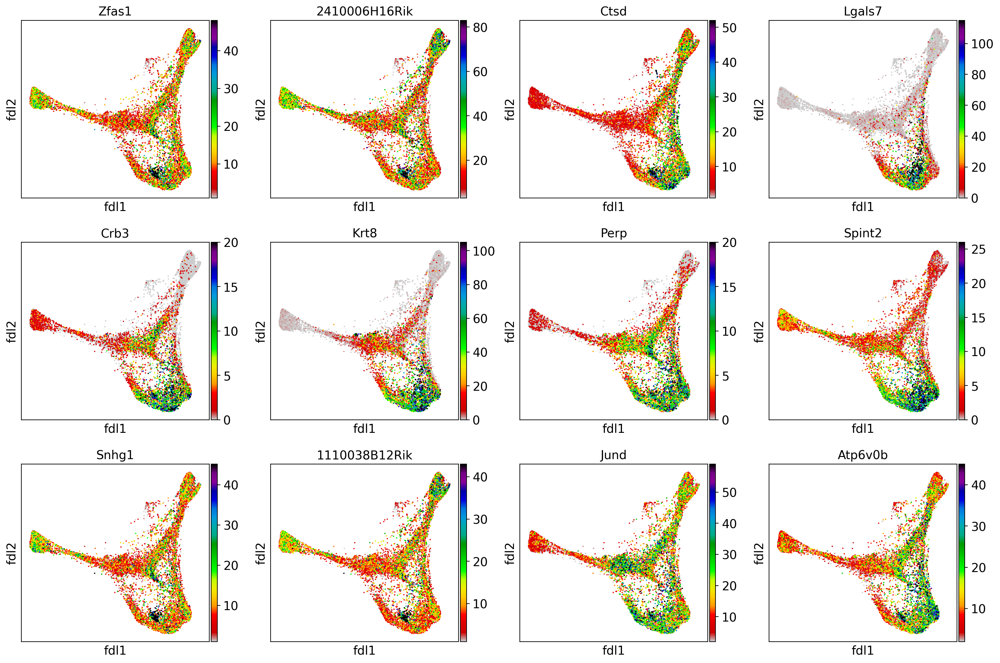

In [18]:
scanpy.pl.embedding(adata_raw, "fdl", color=dead_end_markers[:12], cmap="nipy_spectral_r", vmax="p99", vmin="p10")

  0%|          | 0/12 [00:00<?, ?gene/s]

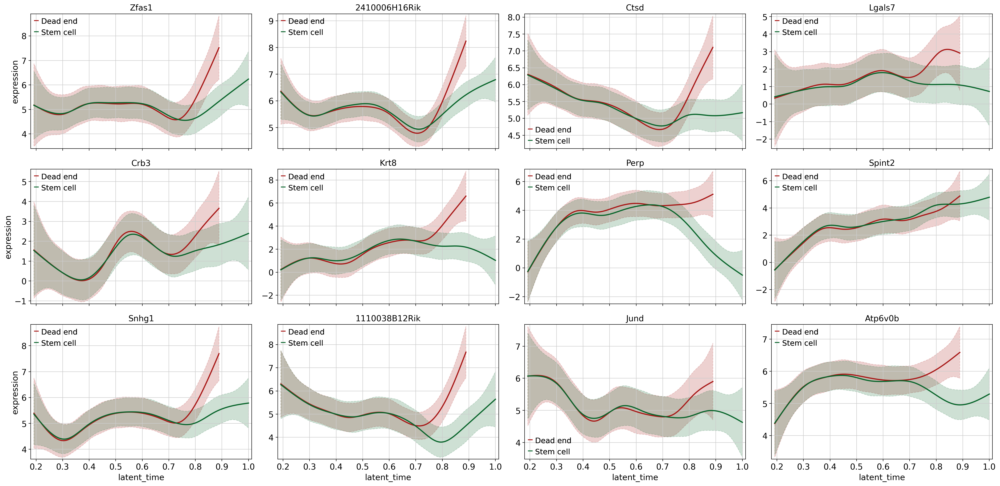

In [33]:
single_cell_analysis.plot_trends_by_trajectory(adata_raw, dead_end_markers[:12], layer="X", n_knots=10, groups=["control", "Hic2"])

Now both Jun and Jund appear, which are damage markers.

In [304]:
from importlib import reload

single_cell_analysis = reload(single_cell_analysis)

## Reactome with Decoupler

In [34]:
# Get MSigDB
msigdb = decoupler.op.resource("MSigDB", organism="mouse")

In [57]:
msigdb["collection"].unique()

array(['reactome_pathways', 'go_cellular_component',
       'chemical_and_genetic_perturbations', 'immunesigdb',
       'tf_targets_legacy', 'cell_type_signatures',
       'go_biological_process', 'positional', 'mirna_targets_mirdb',
       'tf_targets_gtrf', 'cancer_modules', 'vaccine_response',
       'go_molecular_function', 'oncogenic_signatures',
       'cancer_cell_atlas', 'hallmark', 'pid_pathways', 'kegg_pathways',
       'wikipathways', 'human_phenotype_ontology',
       'cancer_gene_neighborhoods', 'mirna_targets_legacy',
       'biocarta_pathways', 'kegg_medicus_pathways'], dtype=object)

In [54]:
reactome = msigdb.query("collection == \"reactome_pathways\"")
# Filter duplicates
reactome = reactome[~reactome.duplicated(("geneset", "genesymbol"))]

# Filtering genesets to match behaviour of fgsea
geneset_size = reactome.groupby("geneset").size()
reactome_filtered_genesets = geneset_size.index[(geneset_size > 15) & (geneset_size < 500)]

reactome.rename(columns={"geneset": "source", "genesymbol": "target"}, inplace=True)

In [55]:
kegg = msigdb.query("collection == \"kegg_pathways\"")
# Filter duplicates
kegg = kegg[~kegg.duplicated(("geneset", "genesymbol"))]

# Filtering genesets to match behaviour of fgsea
geneset_size = kegg.groupby("geneset").size()
kegg_filtered_genesets = geneset_size.index[(geneset_size > 15) & (geneset_size < 500)]

kegg.rename(columns={"geneset": "source", "genesymbol": "target"}, inplace=True)

In [ ]:
scores, pvals = decoupler.mt.gsea(raw_ranks["Dead end"][["scores"]].T, reactome[reactome["source"].isin(reactome_filtered_genesets)])
gsea_results = (
    pandas.concat({"score": scores.T, "pval": pvals.T}, axis=1)
    .droplevel(level=1, axis=1)
    .sort_values("pval")
)
gsea_results.query("score > 0").sort_values("pval", ascending=True).head(30)

,score,pval
REACTOME_ION_CHANNEL_TRANSPORT,1.677302,0.0
REACTOME_IRON_UPTAKE_AND_TRANSPORT,1.717186,0.0
REACTOME_KERATINIZATION,2.403887,0.0
REACTOME_SELENOAMINO_ACID_METABOLISM,2.663883,0.0
REACTOME_SARS_COV_2_HOST_INTERACTIONS,1.556483,0.0
REACTOME_SARS_COV_2_INFECTION,1.236533,0.0
REACTOME_SARS_COV_2_MODULATES_HOST_TRANSLATION_MACHINERY,1.972880,0.0
REACTOME_METABOLISM_OF_AMINO_ACIDS_AND_DERIVATIVES,1.670263,0.0
REACTOME_SARS_COV_1_MODULATES_HOST_TRANSLATION_MACHINERY,2.425987,0.0
REACTOME_MYOCLONIC_EPILEPSY_OF_LAFORA,1.831962,0.0


In [63]:
# Biocarta

gene_sets = msigdb.query("collection == \"hallmark\"")
# Filter duplicates
gene_sets = gene_sets[~gene_sets.duplicated(("geneset", "genesymbol"))]

# Filtering genesets to match behaviour of fgsea
geneset_size = gene_sets.groupby("geneset").size()
filtered_genesets = geneset_size.index[(geneset_size > 0) & (geneset_size < numpy.inf)]

gene_sets.rename(columns={"geneset": "source", "genesymbol": "target"}, inplace=True)

scores, pvals = decoupler.mt.gsea(raw_ranks["Dead end"][["scores"]].T, gene_sets[gene_sets["source"].isin(filtered_genesets)])
gsea_results = (
    pandas.concat({"score": scores.T, "pval": pvals.T}, axis=1)
    .droplevel(level=1, axis=1)
    .sort_values("pval")
)
gsea_results.query("score > 0").sort_values("pval", ascending=True).head(30)

,score,pval
HALLMARK_ESTROGEN_RESPONSE_EARLY,1.616871,0.000000
HALLMARK_HYPOXIA,1.325286,0.000000
HALLMARK_P53_PATHWAY,2.116615,0.000000
HALLMARK_TNFA_SIGNALING_VIA_NFKB,1.949237,0.000000
HALLMARK_HEME_METABOLISM,1.218811,0.077429
HALLMARK_ESTROGEN_RESPONSE_LATE,1.163830,0.080128
HALLMARK_KRAS_SIGNALING_DN,1.098673,0.208333
HALLMARK_MYOGENESIS,1.072315,0.343137
HALLMARK_APICAL_SURFACE,0.977613,0.688705
HALLMARK_NOTCH_SIGNALING,0.808639,0.915570


2026-03-18 15:26:24,286 [WARNING] Duplicated values found in preranked stats: 22.58% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-18 15:26:55,967 [WARNING] Duplicated values found in preranked stats: 0.64% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-18 15:27:25,773 [WARNING] Duplicated values found in preranked stats: 2.36% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-18 15:27:54,899 [WARNING] Duplicated values found in preranked stats: 11.84% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-18 15:28:23,936 [WARNING] Duplicated values found in preranked stats: 4.63% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-18 15:28:53,655 [WARNING] Duplicated values found in preranked stats: 4.46% of genes
The order of those genes will 

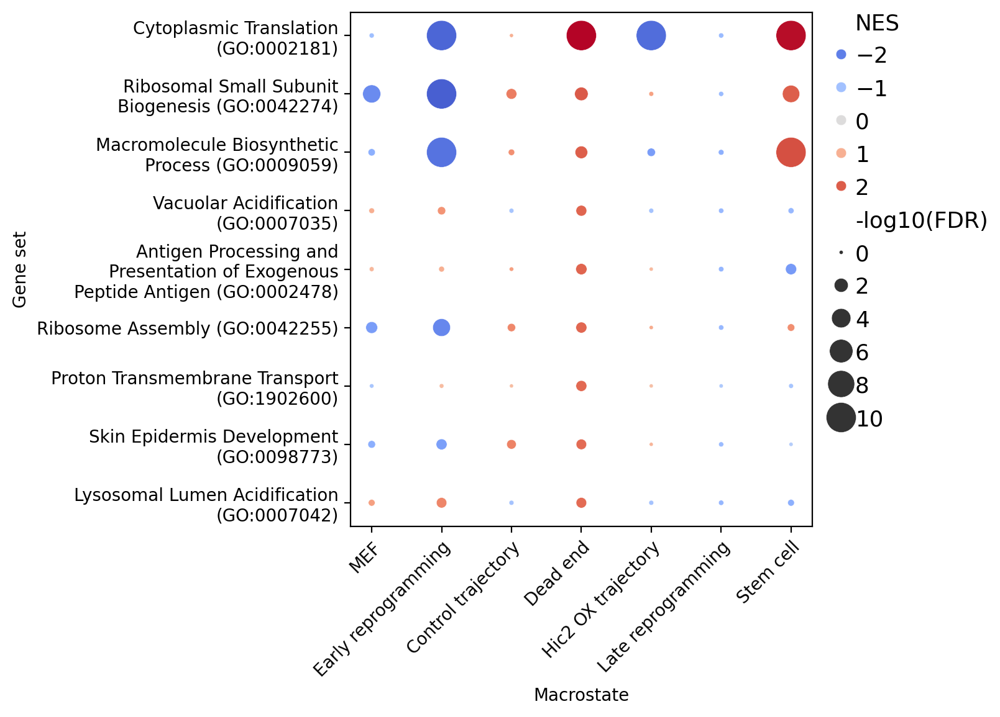

In [178]:
single_cell_analysis.compare_gsea(raw_ranks, "GO_Biological_Process_2025", top_from="Dead end", n_top_terms=12, significance_cutoff=0.1)

In [56]:
# KEGG pathways

scores, pvals = decoupler.mt.gsea(raw_ranks["Dead end"][["scores"]].T, kegg[kegg["source"].isin(kegg_filtered_genesets)])
gsea_results = (
    pandas.concat({"score": scores.T, "pval": pvals.T}, axis=1)
    .droplevel(level=1, axis=1)
    .sort_values("pval")
)
gsea_results.query("score > 0").sort_values("pval", ascending=True).head(30)

,score,pval
KEGG_LYSOSOME,1.588417,0.000000
KEGG_RIBOSOME,2.684543,0.000000
KEGG_EPITHELIAL_CELL_SIGNALING_IN_HELICOBACTER_PYLORI_INFECTION,1.595346,0.000000
KEGG_REGULATION_OF_AUTOPHAGY,1.421701,0.242489
KEGG_VIBRIO_CHOLERAE_INFECTION,1.191888,0.395455
KEGG_AUTOIMMUNE_THYROID_DISEASE,1.250781,0.428571
KEGG_CELL_ADHESION_MOLECULES_CAMS,1.121792,0.480331
KEGG_ALLOGRAFT_REJECTION,1.218681,0.480331
KEGG_BLADDER_CANCER,1.122685,0.523308
KEGG_ASTHMA,1.181303,0.583501


In [212]:
# GO analysis in dead end

macrostate = "Dead end"
gene_set = "GO_Biological_Process_2025"
pre_res = gseapy.prerank(
    rnk=raw_ranks[macrostate][["scores"]], 
    gene_sets=gene_set,
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-18 15:51:37,146 [WARNING] Duplicated values found in preranked stats: 12.03% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,Cytoplasmic Translation (GO:0002181),0.908911,2.812961,0.0,0.0,0.0,78/95,4.29%,Rps15;Rack1;Rpl10a;Rps3;Rps27;Rpl12;Rps12;Rps2...
1,prerank,Macromolecule Biosynthetic Process (GO:0009059),0.725554,2.369675,0.0,0.0,0.0,84/173,4.29%,Eef2;Tnip1;Rps15;Rpl10a;Rps3;Rps27;Rpl12;Rps12...
2,prerank,Ribosomal Small Subunit Biogenesis (GO:0042274),0.77243,2.292265,0.0,0.0,0.0,36/78,6.06%,Rps15;Rps27;Rps12;Rps24;Rps14;Rps5;Rps16;Rps9;...
3,prerank,Translation (GO:0006412),0.665832,2.266302,0.0,0.0,0.0,85/209,4.29%,Eef2;Tnip1;Rps15;Rack1;Rpl10a;Rps3;Rps27;Rpl12...
4,prerank,Ribonucleoprotein Complex Biogenesis (GO:0022613),0.712957,2.250293,0.0,0.0,0.0,41/106,5.34%,Rps15;Rps27;Rps12;Rps24;Rps14;Rps5;Rps16;Rps9;...
5,prerank,Ribosome Biogenesis (GO:0042254),0.643919,2.094345,0.0,0.0,0.0,50/141,5.34%,Rps15;Rps27;Rps12;Rps24;Rps14;Rps5;Rps16;Rps9;...
6,prerank,Ribosome Assembly (GO:0042255),0.767393,2.072721,0.0,0.0,0.0,22/39,10.00%,Rps15;Rps27;Rps14;Rps5;Eif6;Rpsa;Rps19;Fau;Eif...
8,prerank,rRNA Metabolic Process (GO:0016072),0.654923,2.009848,0.0,0.001031,0.008,35/85,6.65%,Rps15;Rps27;Rps24;Rps16;Dedd2;Rps25;Rps19;Rpl7...
9,prerank,rRNA Processing (GO:0006364),0.639337,1.987076,0.0,0.002291,0.019,39/101,6.79%,Rps15;Rps27;Rps24;Rps14;Rps16;Eif6;Rps25;Rps19...
10,prerank,Gene Expression (GO:0010467),0.561494,1.974622,0.0,0.002989,0.025,113/344,7.41%,Tnip1;Rps15;Rpl10a;Klk11;Rps3;Rps27;Rpl12;Rps1...


In [210]:
# MsigDB in dead end

macrostate = "Dead end"
gene_set = "MSigDB_Hallmark_2020"
pre_res = gseapy.prerank(
    rnk=raw_ranks[macrostate][["scores"]], 
    gene_sets=gene_set,
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-18 15:50:31,903 [WARNING] Duplicated values found in preranked stats: 12.03% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
1,prerank,p53 Pathway,0.633766,2.1347,0.0,0.0,0.0,66/187,8.18%,Ctsd;Perp;Cdkn1a;Sfn;Krt17;Tob1;Rack1;Btg2;Ppp...
4,prerank,TNF-alpha Signaling via NF-kB,0.563896,1.900756,0.0,0.000953,0.001,68/187,10.79%,Cdkn1a;Tnip1;Eif1;Btg2;Ppp1r15a;Sat1;Jun;Btg1;...
5,prerank,Estrogen Response Early,0.488989,1.643837,0.0,0.008257,0.013,66/185,12.33%,Krt8;Sfn;Aqp3;Tob1;Ablim1;Lad1;Cldn7;Klk10;Itp...
13,prerank,Unfolded Protein Response,0.46423,1.455621,0.007435,0.050969,0.1,27/106,6.63%,Eef2;Rps14;Atf3;Atf4;Eif4a2;Atp6v0d1;Ddit4;Npm...
15,prerank,Hypoxia,0.422895,1.428864,0.0,0.054112,0.128,49/180,8.06%,Cdkn1a;Ppp1r15a;Jun;Btg1;Atf3;Ndrg1;Akap12;Ddi...
20,prerank,heme Metabolism,0.399889,1.320251,0.019231,0.127024,0.319,43/170,9.46%,Aqp3;Btg2;Agpat4;Klf3;Myl4;Hebp1;Mxi1;Tns1;Cts...
23,prerank,Protein Secretion,0.406398,1.276393,0.053571,0.169305,0.442,35/93,11.88%,Napa;Golga4;Cln5;Rab14;Tom1l1;Clta;Scrn1;Kif1b...
24,prerank,UV Response Up,0.381877,1.243294,0.052419,0.199349,0.541,36/145,8.69%,Aqp3;Btg2;Btg1;Sqstm1;Atf3;Gch1;Eif5;Atp6v1c1;...
26,prerank,Estrogen Response Late,0.369126,1.24027,0.035533,0.181857,0.545,41/180,9.65%,Perp;Sfn;Tob1;Cd9;Klk11;Cdh1;St14;Klk10;Itpk1;...
29,prerank,PI3K/AKT/mTOR Signaling,0.369656,1.152811,0.14386,0.338393,0.818,20/99,7.84%,Cdkn1a;Sfn;Sqstm1;Mknk2;Ralb;Prkaa2;Ube2d3;Ddi...


2026-03-18 15:50:54,436 [WARNING] Duplicated values found in preranked stats: 22.82% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-18 15:50:55,100 [WARNING] Duplicated values found in preranked stats: 0.67% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-18 15:50:55,777 [WARNING] Duplicated values found in preranked stats: 2.44% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-18 15:50:56,448 [WARNING] Duplicated values found in preranked stats: 12.03% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-18 15:50:57,151 [WARNING] Duplicated values found in preranked stats: 4.68% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-18 15:50:57,809 [WARNING] Duplicated values found in preranked stats: 4.45% of genes
The order of those genes will 

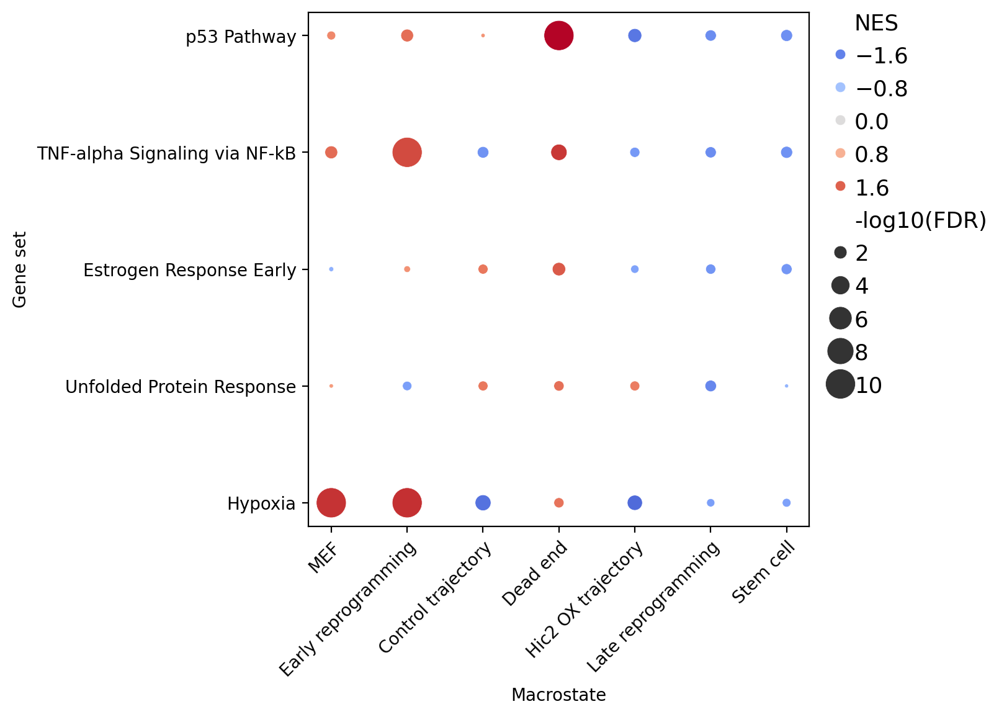

In [211]:
single_cell_analysis.compare_gsea(adata_raw, "MSigDB_Hallmark_2020", top_from="Dead end", n_top_terms=10, significance_cutoff=0.1, enrichment_cutoff=0)

In [17]:
# Cell types in the dead end

macrostate = "Dead end"
gene_set = "PanglaoDB_Augmented_2021"
pre_res = gseapy.prerank(
    rnk=raw_ranks[macrostate][["scores"]], 
    gene_sets=gene_set,
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-20 17:31:57,022 [WARNING] Duplicated values found in preranked stats: 11.78% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,Trichocytes,0.816192,2.598519,0.0,0.0,0.0,49/83,10.54%,Krt8;Perp;Krt17;S100a14;Sfn;Dsp;S100a16;Cldn4;...
1,prerank,Cholangiocytes,0.799532,2.56153,0.0,0.0,0.0,36/93,8.39%,Crb3;Krt8;S100a14;Cldn4;Lad1;Cdh1;Mal2;Rab25;S...
2,prerank,Keratinocytes,0.768214,2.483248,0.0,0.0,0.0,41/85,10.54%,Lgals7;Perp;Aqp3;Krt17;S100a14;Sfn;Lad1;Nectin...
3,prerank,Mammary Epithelial Cells,0.767225,2.469932,0.0,0.0,0.0,53/113,8.71%,Krt8;Perp;Krt17;S100a14;Sfn;Dsp;S100a16;Cldn4;...
4,prerank,Luminal Epithelial Cells,0.751185,2.441272,0.0,0.0,0.0,39/113,6.43%,Crb3;Krt8;Perp;Aqp3;S100a14;Sfn;Dsp;Cldn4;Lad1...
5,prerank,Gastric Chief Cells,0.766921,2.416637,0.0,0.0,0.0,35/86,9.26%,Crb3;S100a14;Dsp;Cldn4;Lad1;Spint1;Cdh1;Mal2;R...
6,prerank,Hepatoblasts,0.729691,2.401052,0.0,0.0,0.0,31/80,8.23%,Krt8;S100a14;Dsp;Cldn4;Lad1;Cdh1;Mal2;Cldn3;Ep...
7,prerank,Airway Goblet Cells,0.755814,2.3672,0.0,0.0,0.0,27/78,8.39%,S100a14;Sfn;Cldn4;Lad1;Nectin4;Cdh1;Rab25;Cldn...
8,prerank,Principal Cells,0.720233,2.354939,0.0,0.0,0.0,41/106,9.26%,Aqp3;S100a14;Dsp;Cldn4;Lad1;Cdh1;Mal2;Rab25;Cl...
9,prerank,Urothelial Cells,0.711522,2.320672,0.0,0.0,0.0,49/93,12.85%,Crb3;Aqp3;Spint1;Nectin4;St14;Dtx2;Sytl1;Slc9a...


2026-03-20 17:46:15,602 [WARNING] Duplicated values found in preranked stats: 22.57% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-20 17:46:18,146 [WARNING] Duplicated values found in preranked stats: 0.58% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-20 17:46:20,496 [WARNING] Duplicated values found in preranked stats: 2.37% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-20 17:46:23,046 [WARNING] Duplicated values found in preranked stats: 11.78% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-20 17:46:25,251 [WARNING] Duplicated values found in preranked stats: 4.64% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-20 17:46:27,520 [WARNING] Duplicated values found in preranked stats: 4.48% of genes
The order of those genes will 

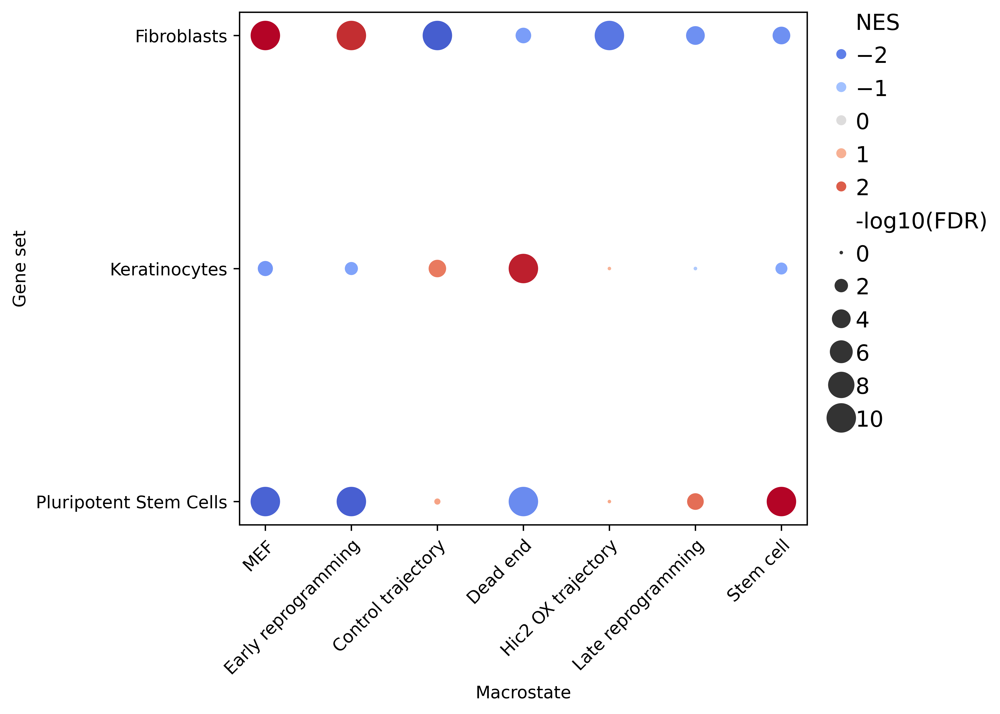

In [25]:
# Specific cell types

single_cell_analysis.compare_gsea(adata_raw, gene_set="PanglaoDB_Augmented_2021", group_key="macrostate", n_top_terms=10, significance_cutoff=1,
                                  terms=["Fibroblasts", "Keratinocytes", "Pluripotent Stem Cells"])

2026-03-20 17:31:11,677 [WARNING] Duplicated values found in preranked stats: 22.57% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-20 17:31:13,999 [WARNING] Duplicated values found in preranked stats: 0.58% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-20 17:31:16,265 [WARNING] Duplicated values found in preranked stats: 2.37% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-20 17:31:18,574 [WARNING] Duplicated values found in preranked stats: 11.78% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-20 17:31:20,944 [WARNING] Duplicated values found in preranked stats: 4.64% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-20 17:31:23,427 [WARNING] Duplicated values found in preranked stats: 4.48% of genes
The order of those genes will 

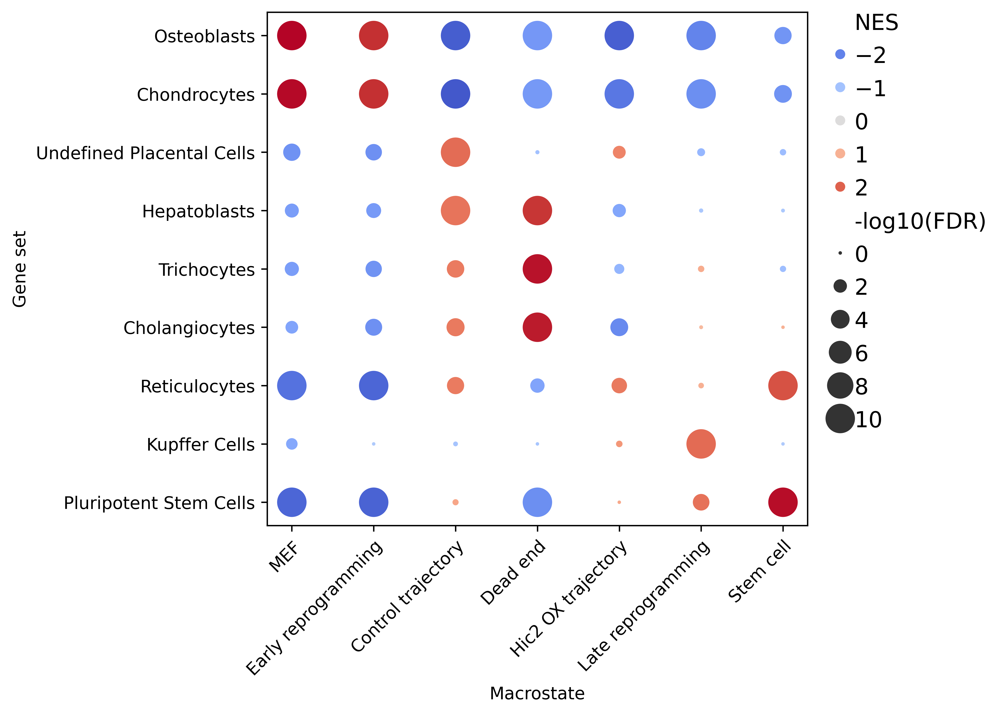

In [16]:
# Cell types

single_cell_analysis.compare_gsea(adata_raw, gene_set="PanglaoDB_Augmented_2021", group_key="macrostate", n_top_terms=2, significance_cutoff=1)

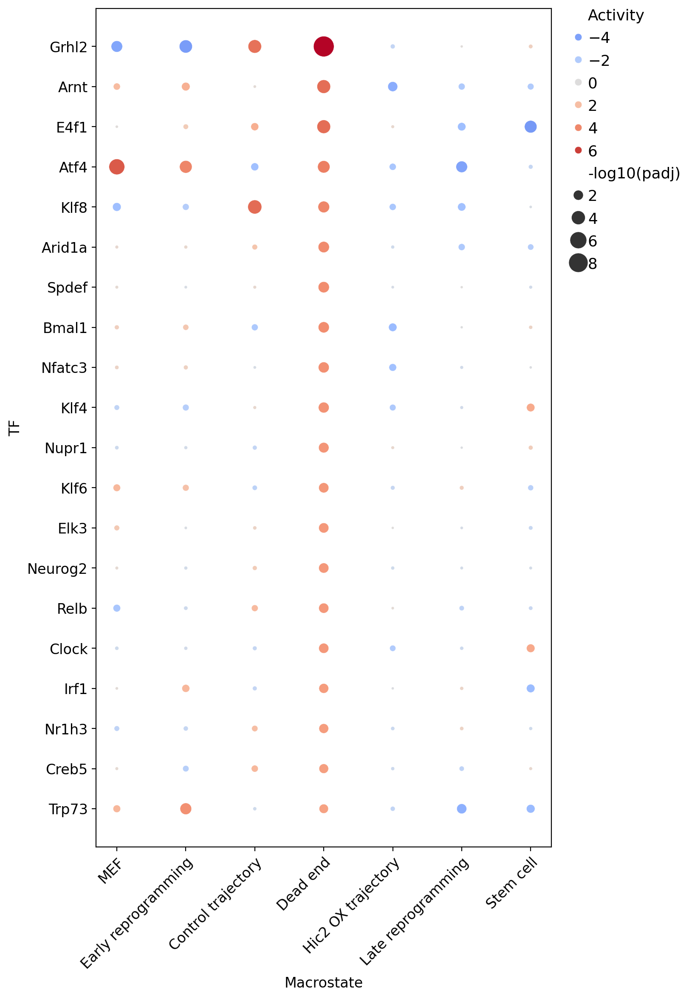

In [199]:
# TF activity in dead end

single_cell_analysis.plot_tf_activity(adata_raw, network=collectri_df, top_from="Dead end", n_top=20)

Grhl2 is a MET driver, E4f1 regulates p53, Arnt is a damage marker

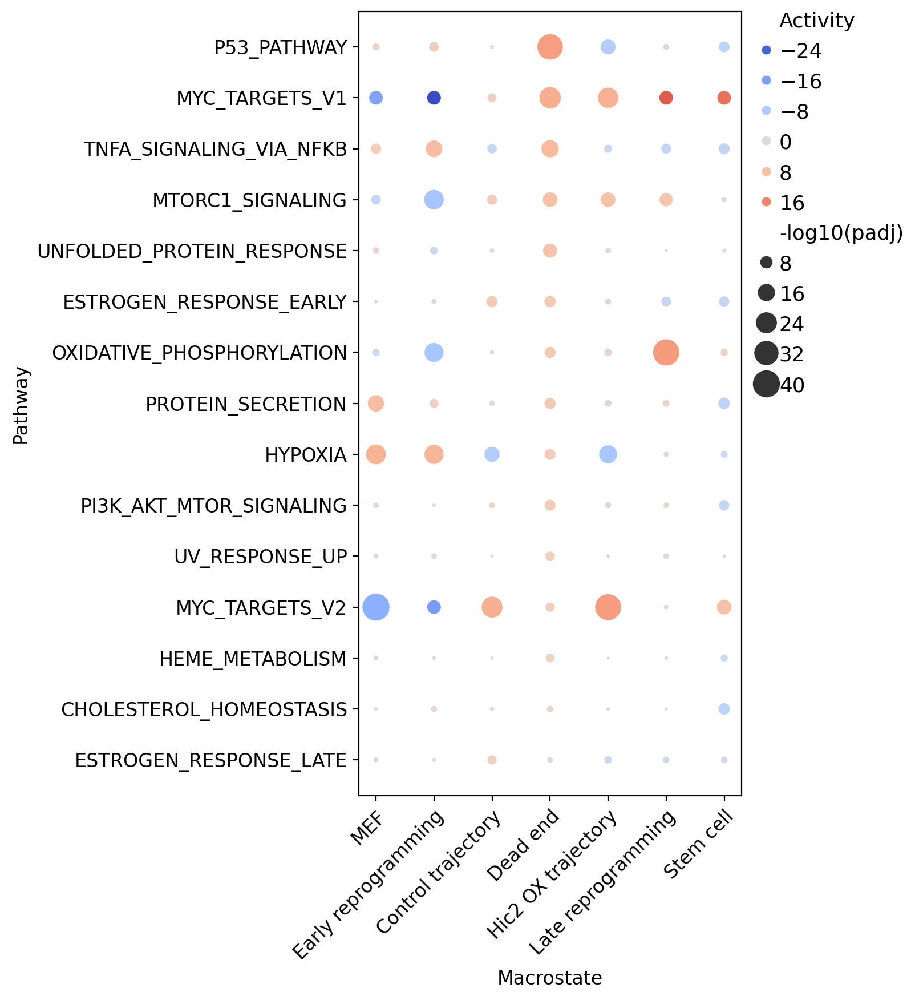

In [308]:
# Hallmark in dead end

single_cell_analysis.plot_tf_activity(adata_raw, network=hallmark_df, n_top = 15, activity_cutoff = 0, significance_cutoff = 0.05, pathway_key = "Pathway", top_from="Dead end")

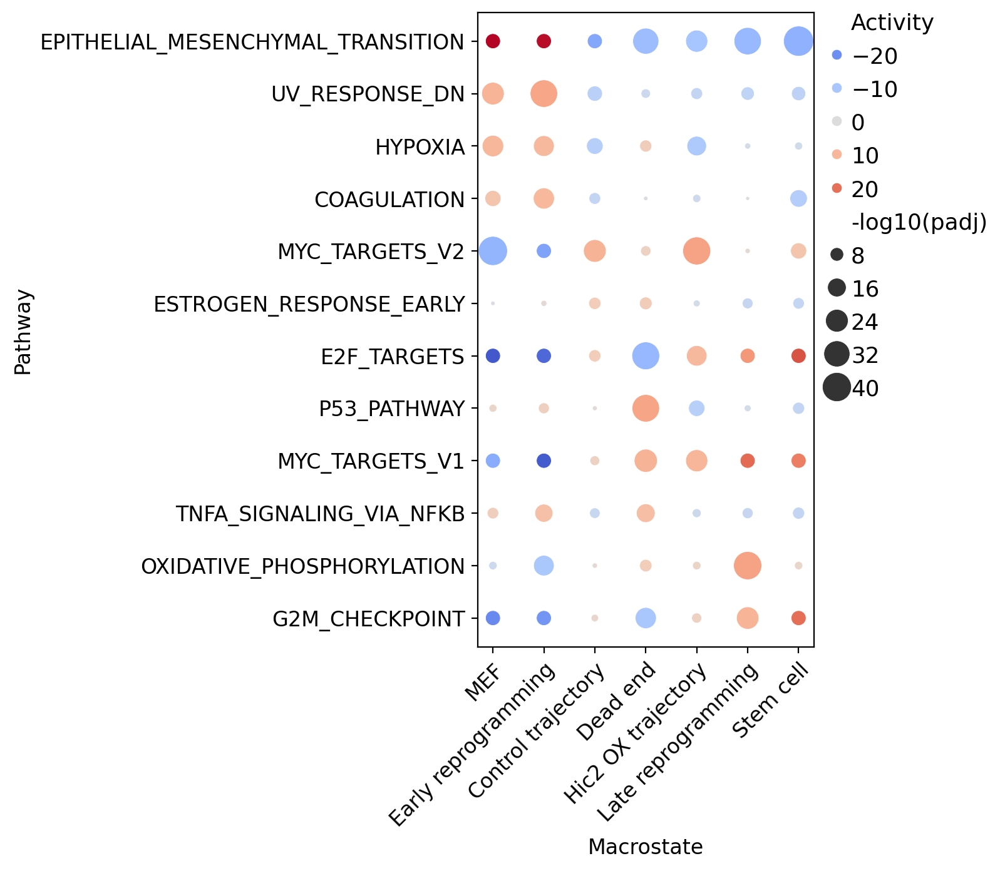

In [ ]:
# Hallmark in all

single_cell_analysis.plot_tf_activity(adata_raw, network=hallmark_df, n_top = 3, activity_cutoff = 0, significance_cutoff = 0.1, pathway_key = "Pathway")

# MET and EMT markers

In [ ]:
reprogramming_group_indices = (adata.obs["group"] == "control") | (adata.obs["group"] == "Hic2")

In [ ]:
met_drivers = ["Bmp4", "Bmp7", "Smad1", "Smad5", "Cdh1", "Ovol1", "Ovol2"]
emt_drivers = ["Cdh2", "Zeb1", "Zeb2", "Tgfb1", "Tgfb2", "Tgfbr2", "Tgfbr3", "Snai1", "Snai2"]

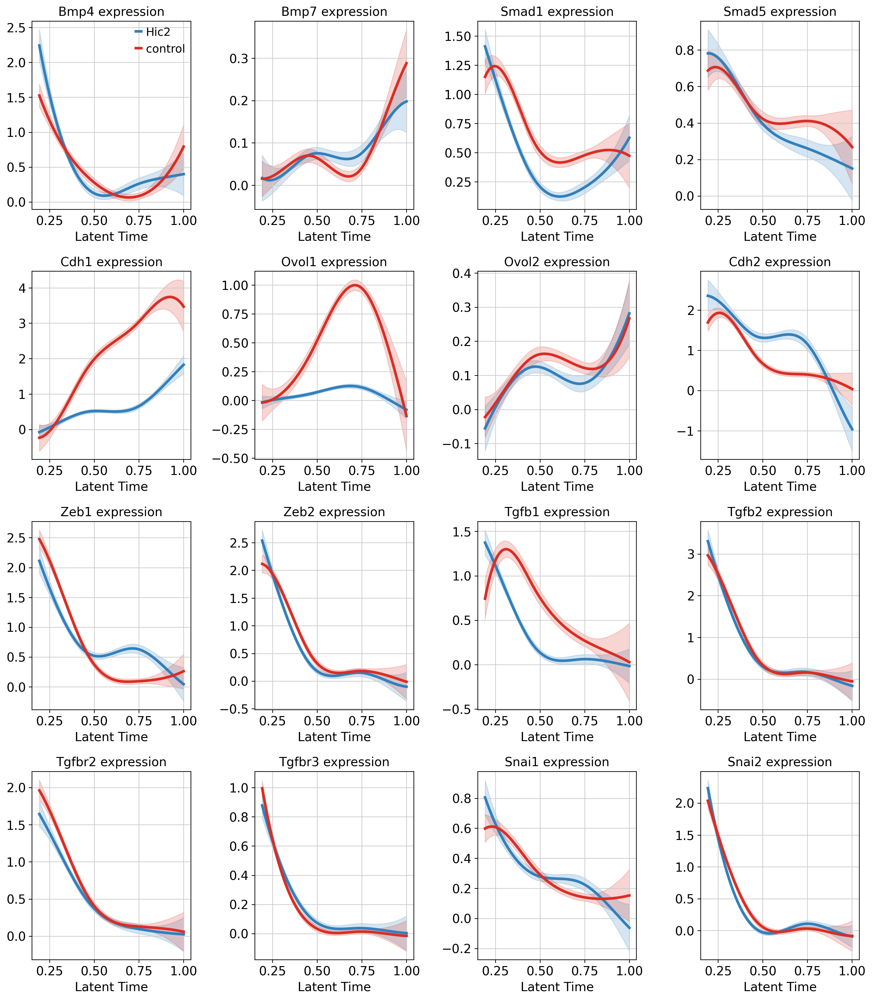

In [ ]:
# Expression of drivers

single_cell_analysis.plot_grouped_gene_trend(
    adata, 
    met_drivers + emt_drivers, 
    group_key="group",
    groups=["Hic2", "control"],
    layer="raw"
)

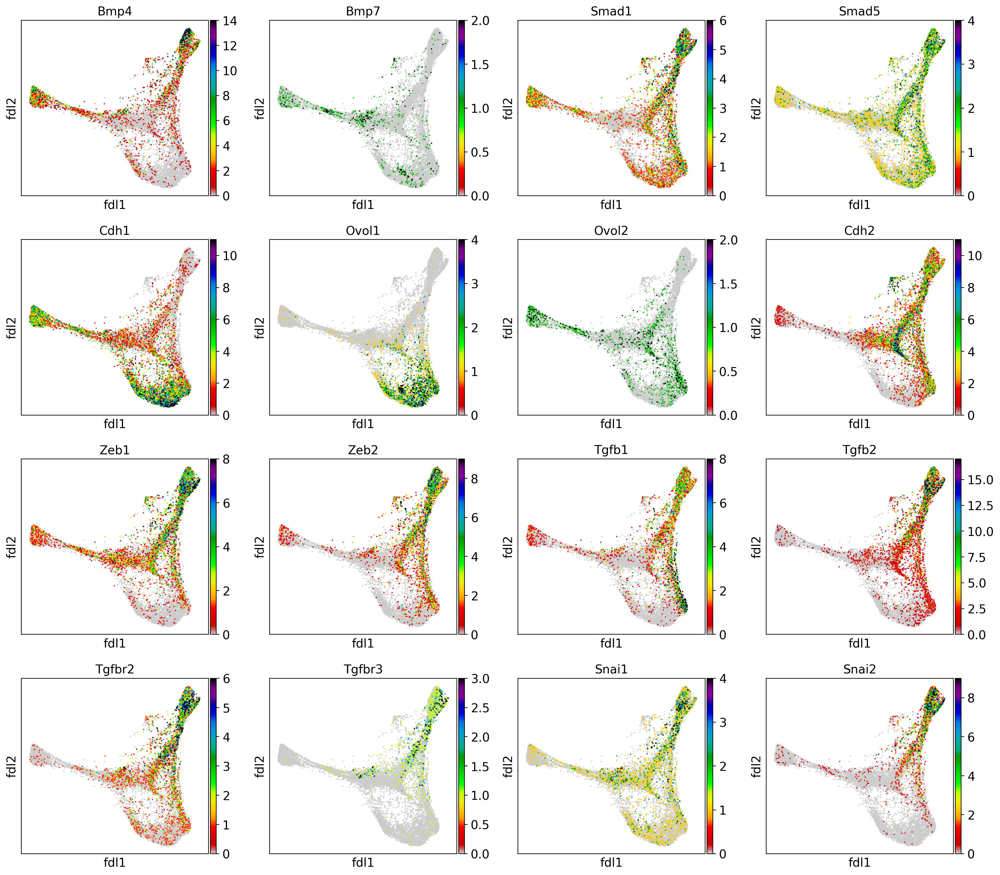

In [ ]:
# Plot where cell types are found

scanpy.pl.embedding(
    adata,
    basis="fdl",
    color=met_drivers + emt_drivers,
    cmap="nipy_spectral_r",
    show=True,
    vmax="p99.5"
)

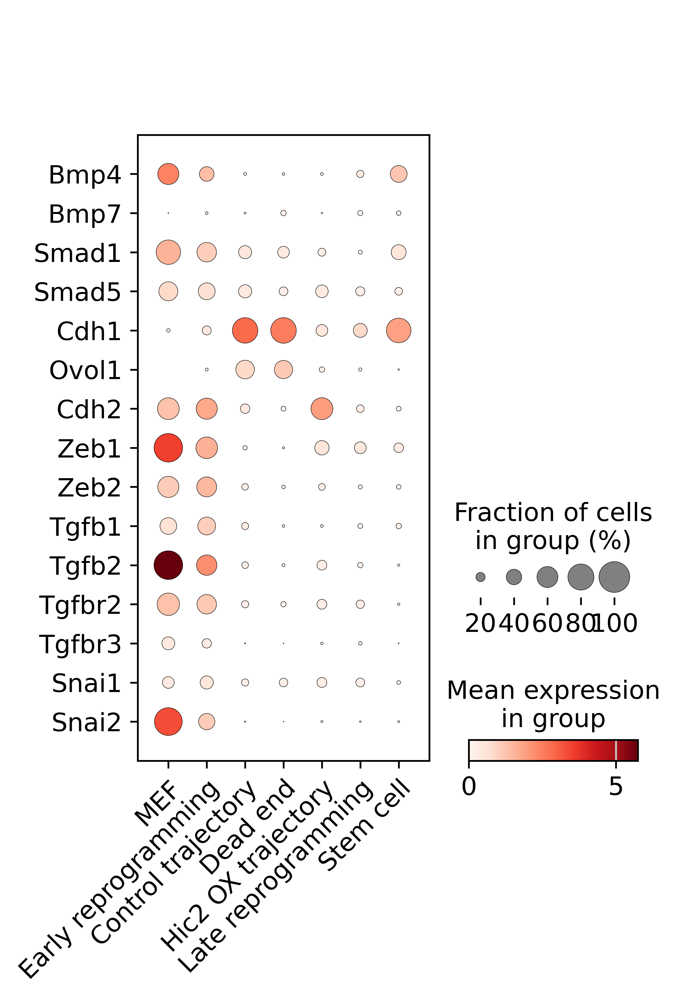

In [ ]:
# Most upregulated transcription factors in dead end

axis = scanpy.pl.dotplot(adata, met_drivers+emt_drivers, "macrostate", swap_axes=True, show=False, use_raw=True)["mainplot_ax"]
axis.set_xticklabels(axis.get_xticklabels(), rotation=45, rotation_mode="anchor", ha="right")
figure = pyplot.gcf()
pyplot.show()


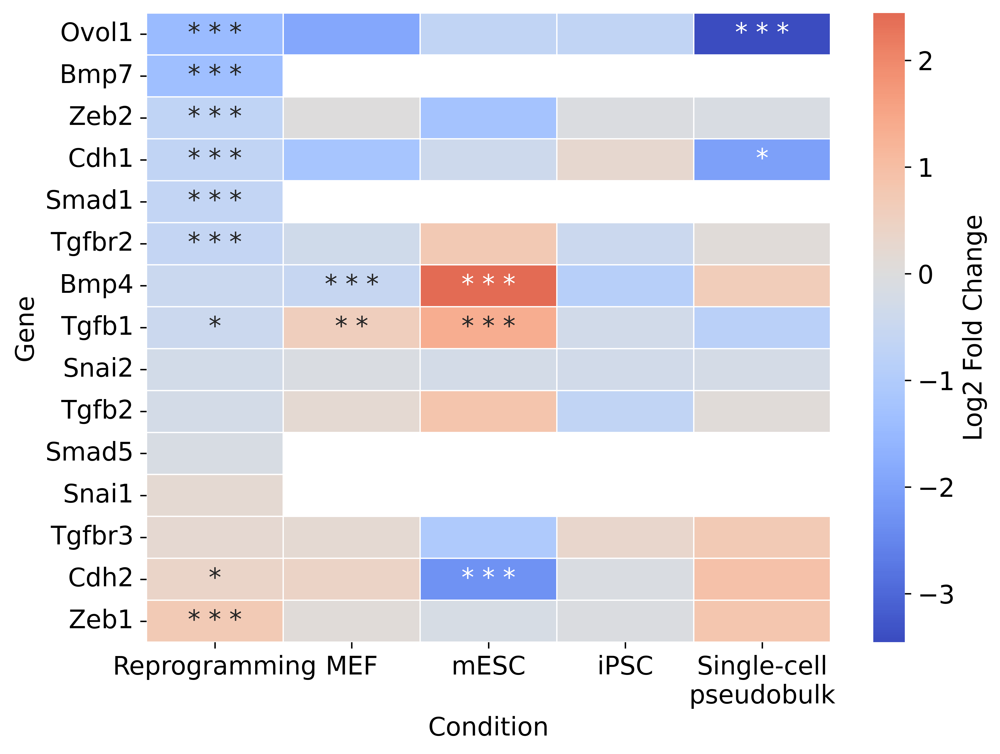

In [ ]:
# Plot LFCs

# assign the filtered and sorted dataframe slice to a variable
plot_data = bulk_de.loc[met_drivers+emt_drivers].sort_values("Reprogramming LFC")

# separate the log fold change columns and the adjusted p-value columns
lfc_columns = ["Reprogramming LFC", "MEF LFC", "mESC LFC", "iPSC LFC", "Single-cell LFC"]
padj_columns = ["Reprogramming p adjusted", "MEF p adjusted", "mESC p adjusted", "iPSC p adjusted", "Single-cell p adjusted"]

lfc_matrix = plot_data[lfc_columns]
padj_matrix = plot_data[padj_columns]

# clean the column names for the x-axis labels on the final plot
lfc_matrix.columns = ["Reprogramming", "MEF", "mESC", "iPSC", "Single-cell\npseudobulk"]

# convert the adjusted p-values to a float array
padj_array = padj_matrix.to_numpy(dtype=float)
# Replace NaN with 1
numpy.nan_to_num(padj_array, nan=1, copy=False)

# generate an annotation matrix where significant values receive an asterisk
# the condition ignores nan values to prevent runtime warnings
significance_annotations = numpy.full(padj_array.shape, "", dtype=numpy.dtypes.StrDType)
significance_annotations[padj_array < 0.05] += "*"
significance_annotations[padj_array < 0.01] += " *"
significance_annotations[padj_array < 0.001] += " *"
# numpy.where((padj_array < 0.05) & (~numpy.isnan(padj_array)), "*", "")

# initialize the figure canvas
matplotlib.pyplot.figure(figsize=(8, 6))

# plot the heatmap using a divergent colormap centered at zero
seaborn.heatmap(
    data=lfc_matrix,
    annot=significance_annotations,
    fmt="s",
    cmap="coolwarm",
    center=0,
    linewidths=0.5,
    cbar_kws={"label": "Log2 Fold Change"}
)

# apply axis labels and adjust the layout to prevent clipping
matplotlib.pyplot.grid(False)
matplotlib.pyplot.xlabel("Condition")
matplotlib.pyplot.ylabel("Gene")
matplotlib.pyplot.tight_layout()
matplotlib.pyplot.show()

In [ ]:
reprogramming_columns = ["Reprogramming LFC", "Reprogramming p adjusted", "Single-cell LFC", "Single-cell p adjusted", "iPSC base mean"]
bulk_de.loc[met_drivers+emt_drivers, reprogramming_columns]

,Reprogramming LFC,Reprogramming p adjusted,Single-cell LFC,Single-cell p adjusted,iPSC base mean
Bmp4,-0.459627,1.563440e-01,0.635041,0.465578,725.344396
Bmp7,-1.360614,4.358433e-04,NaN,NaN,NaN
Smad1,-0.634958,2.061984e-09,NaN,NaN,NaN
Smad5,-0.137126,5.219085e-02,NaN,NaN,NaN
Cdh1,-0.650625,1.697320e-09,-2.046292,0.040079,5649.633461
Ovol1,-1.451013,8.662382e-14,-3.455977,0.000086,11.147908
Cdh2,0.392772,1.099432e-02,0.939773,0.460274,133.046538
Zeb1,0.709381,4.964969e-09,0.818585,0.284839,456.080328
Zeb2,-0.667758,5.697484e-06,-0.120855,0.937358,107.505566
Tgfb1,-0.451856,3.105410e-02,-0.816136,0.548580,60.065119


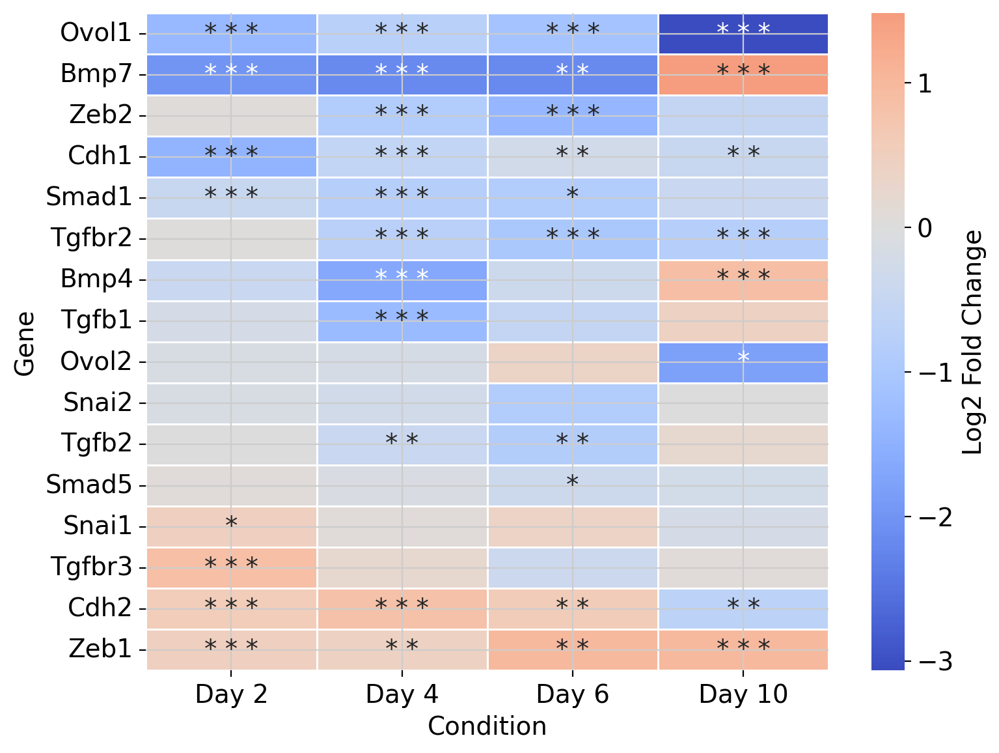

In [ ]:
# Compare time points

# assign the filtered and sorted dataframe slice to a variable
plot_data = bulk_de.loc[met_drivers + emt_drivers].sort_values("Reprogramming LFC")

# separate the log fold change columns and the adjusted p-value columns
lfc_columns = ["Day 2 LFC", "Day 4 LFC", "Day 6 LFC", "Day 10 LFC"]
padj_columns = ["Day 2 p adjusted", "Day 4 p adjusted", "Day 6 p adjusted", "Day 10 p adjusted"]

lfc_matrix = plot_data[lfc_columns]
padj_matrix = plot_data[padj_columns]

# clean the column names for the x-axis labels on the final plot
lfc_matrix.columns = ["Day 2", "Day 4", "Day 6", "Day 10"]

# convert the adjusted p-values to a float array
padj_array = padj_matrix.to_numpy(dtype=float)
# Replace NaN with 1
numpy.nan_to_num(padj_array, nan=1, copy=False)

# generate an annotation matrix where significant values receive an asterisk
# the condition ignores nan values to prevent runtime warnings
significance_annotations = numpy.full(padj_array.shape, "", dtype=numpy.dtypes.StrDType)
significance_annotations[padj_array < 0.05] += "*"
significance_annotations[padj_array < 0.01] += " *"
significance_annotations[padj_array < 0.001] += " *"
# numpy.where((padj_array < 0.05) & (~numpy.isnan(padj_array)), "*", "")

# initialize the figure canvas
matplotlib.pyplot.figure(figsize=(8, 6))

# plot the heatmap using a divergent colormap centered at zero
seaborn.heatmap(
    data=lfc_matrix,
    annot=significance_annotations,
    fmt="s",
    cmap="coolwarm",
    center=0,
    linewidths=0.5,
    cbar_kws={"label": "Log2 Fold Change"}
)

# apply axis labels and adjust the layout to prevent clipping
matplotlib.pyplot.xlabel("Condition")
matplotlib.pyplot.ylabel("Gene")
matplotlib.pyplot.tight_layout()
matplotlib.pyplot.show()

BMP7 is probably lower in control at the start because it is upregulated in MEFs, and control cells are MEFs for longer.